In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv("/content/store5.csv")

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55572 entries, 0 to 55571
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           55572 non-null  int64  
 1   date         55572 non-null  object 
 2   store_nbr    55572 non-null  int64  
 3   family       55572 non-null  object 
 4   sales        55572 non-null  float64
 5   onpromotion  55572 non-null  int64  
 6   dcoilwtico   38379 non-null  float64
dtypes: float64(2), int64(3), object(2)
memory usage: 3.0+ MB


In [4]:
df = df.drop(columns=['id', 'dcoilwtico'], axis=1)

In [5]:
df['date'] = pd.to_datetime(df['date'])
df.set_index('date', inplace=True)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 55572 entries, 2013-01-01 to 2017-08-15
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   store_nbr    55572 non-null  int64  
 1   family       55572 non-null  object 
 2   sales        55572 non-null  float64
 3   onpromotion  55572 non-null  int64  
dtypes: float64(1), int64(2), object(1)
memory usage: 2.1+ MB


In [7]:
df.head()

,store_nbr,family,sales,onpromotion
date,,,,
2013-01-01,5,AUTOMOTIVE,0.0,0
2013-01-01,5,BABY CARE,0.0,0
2013-01-01,5,BEAUTY,0.0,0
2013-01-01,5,BEVERAGES,0.0,0
2013-01-01,5,BOOKS,0.0,0


In [8]:
df.tail()

,store_nbr,family,sales,onpromotion
date,,,,
2017-08-15,5,POULTRY,241.011,1
2017-08-15,5,PREPARED FOODS,52.121,0
2017-08-15,5,PRODUCE,1357.823,4
2017-08-15,5,SCHOOL AND OFFICE SUPPLIES,0.000,0
2017-08-15,5,SEAFOOD,9.669,0


In [9]:
print(df['family'].unique())
print(len(df['family'].unique()))

['AUTOMOTIVE' 'BABY CARE' 'BEAUTY' 'BEVERAGES' 'BOOKS' 'BREAD/BAKERY'
 'CELEBRATION' 'CLEANING' 'DAIRY' 'DELI' 'EGGS' 'FROZEN FOODS' 'GROCERY I'
 'GROCERY II' 'HARDWARE' 'HOME AND KITCHEN I' 'HOME AND KITCHEN II'
 'HOME APPLIANCES' 'HOME CARE' 'LADIESWEAR' 'LAWN AND GARDEN' 'LINGERIE'
 'LIQUOR,WINE,BEER' 'MAGAZINES' 'MEATS' 'PERSONAL CARE' 'PET SUPPLIES'
 'PLAYERS AND ELECTRONICS' 'POULTRY' 'PREPARED FOODS' 'PRODUCE'
 'SCHOOL AND OFFICE SUPPLIES' 'SEAFOOD']
33


In [10]:
for col in df.columns:
    print(col, df[col].value_counts())

store_nbr store_nbr
5    55572
Name: count, dtype: int64
family family
AUTOMOTIVE                    1684
HOME APPLIANCES               1684
SCHOOL AND OFFICE SUPPLIES    1684
PRODUCE                       1684
PREPARED FOODS                1684
POULTRY                       1684
PLAYERS AND ELECTRONICS       1684
PET SUPPLIES                  1684
PERSONAL CARE                 1684
MEATS                         1684
MAGAZINES                     1684
LIQUOR,WINE,BEER              1684
LINGERIE                      1684
LAWN AND GARDEN               1684
LADIESWEAR                    1684
HOME CARE                     1684
HOME AND KITCHEN II           1684
BABY CARE                     1684
HOME AND KITCHEN I            1684
HARDWARE                      1684
GROCERY II                    1684
GROCERY I                     1684
FROZEN FOODS                  1684
EGGS                          1684
DELI                          1684
DAIRY                         1684
CLEANING           

In [11]:
filtered_fam = ['GROCERY I', 'GROCERY II', 'HARDWARE', 'HOME AND KITCHEN I', 'HOME AND KITCHEN II', 'HOME APPLIANCES']

In [12]:
df_filtered_w = {}
for fam in filtered_fam:
  df_filtered_w[fam] = df[df['family']==fam].resample('W').agg({'sales':'sum'})

In [13]:
df_filtered_m = {}
for fam in filtered_fam:
  df_filtered_m[fam] = df[df['family']==fam].resample('M').agg({'sales':'sum'})

In [15]:
df_filtered_w['HARDWARE']

,sales
date,
2013-01-06,7.0
2013-01-13,10.0
2013-01-20,7.0
2013-01-27,0.0
2013-02-03,5.0
...,...
2017-07-23,10.0
2017-07-30,7.0
2017-08-06,8.0


Plot of GROCERY I


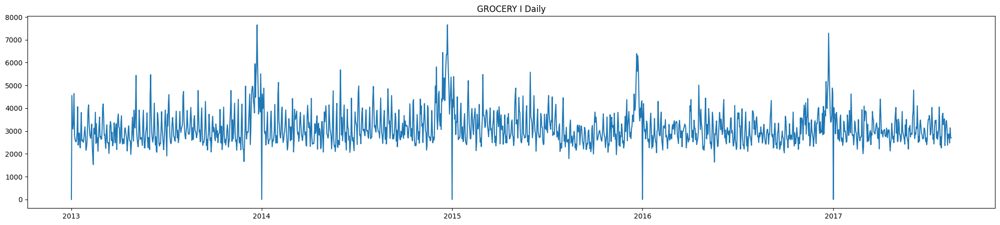

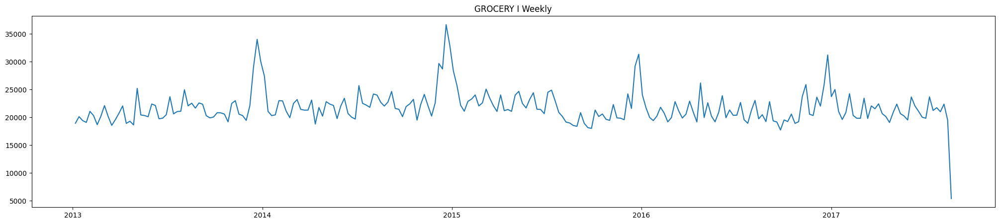

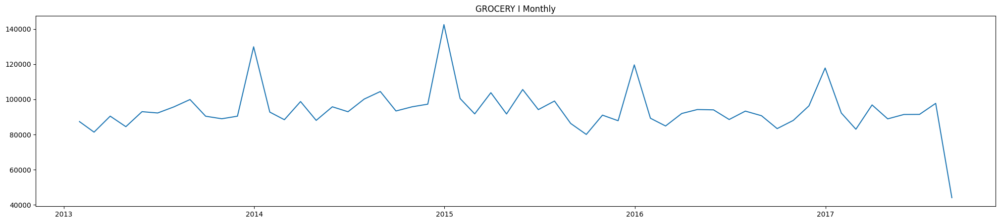


Plot of GROCERY II


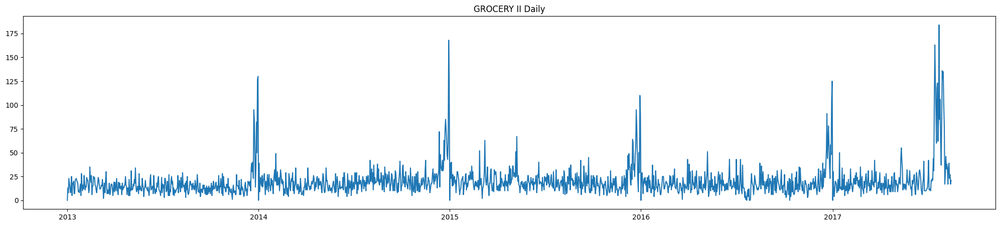

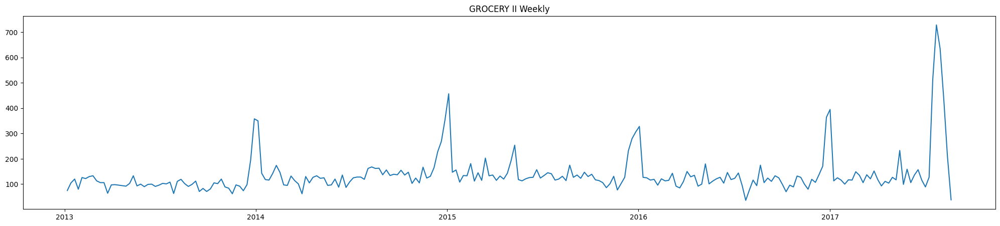

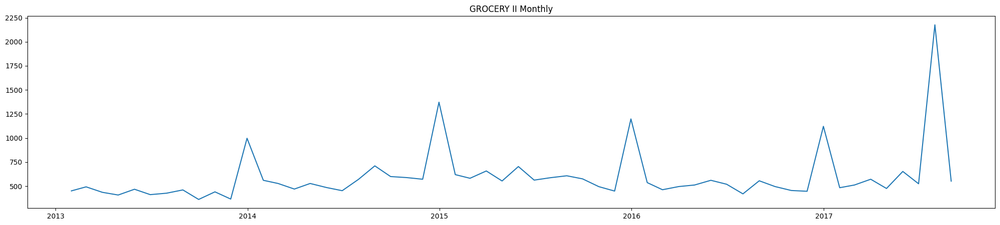


Plot of HARDWARE


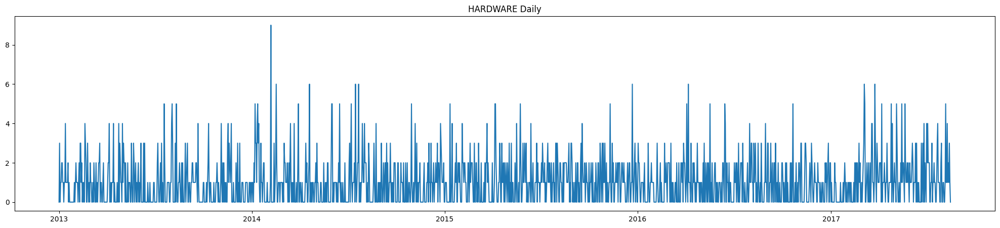

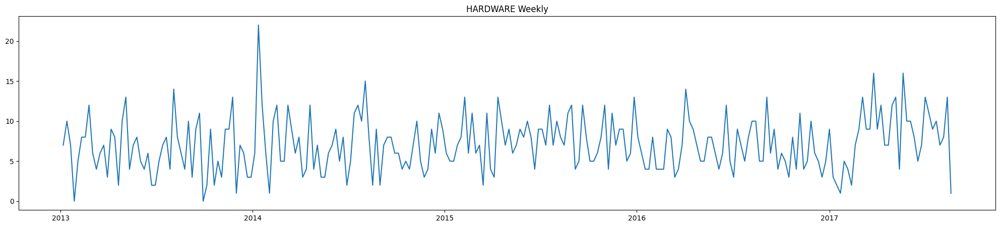

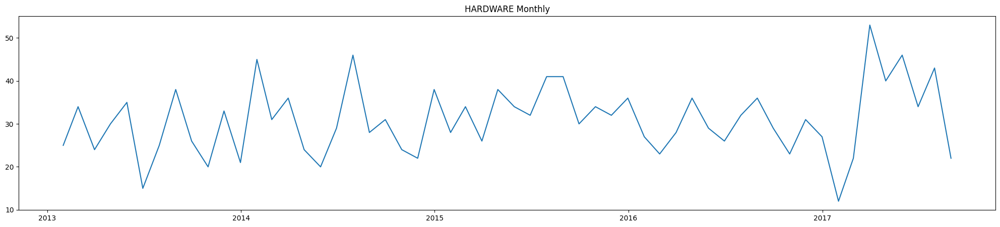


Plot of HOME AND KITCHEN I


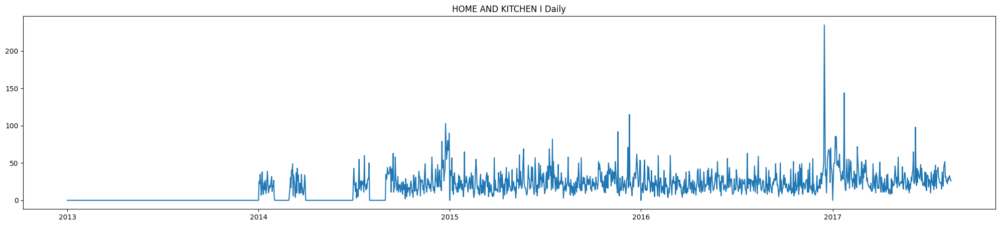

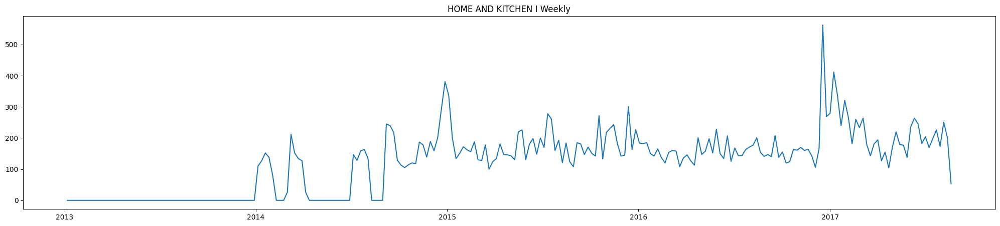

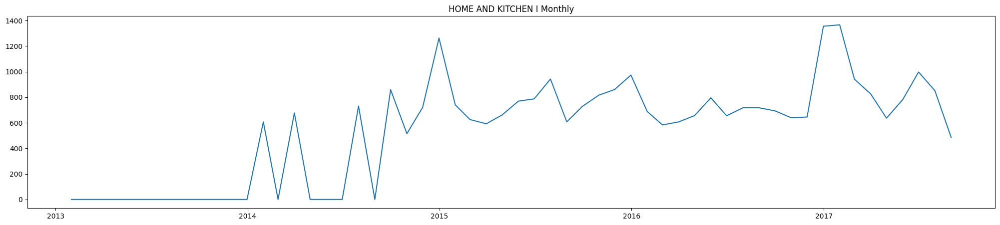


Plot of HOME AND KITCHEN II


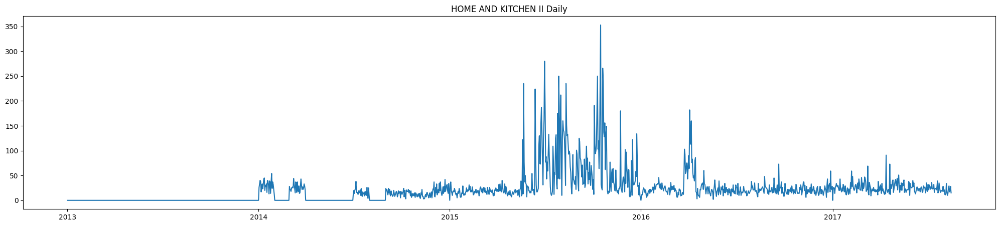

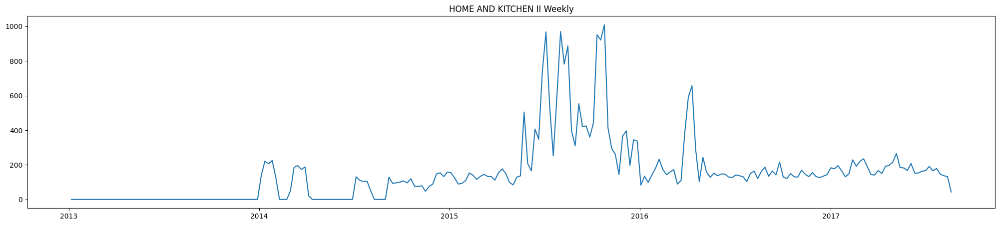

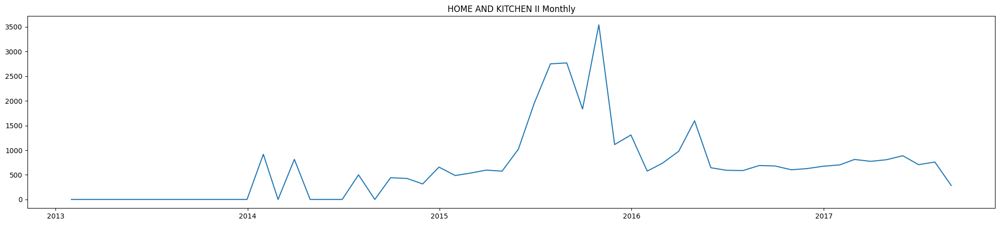


Plot of HOME APPLIANCES


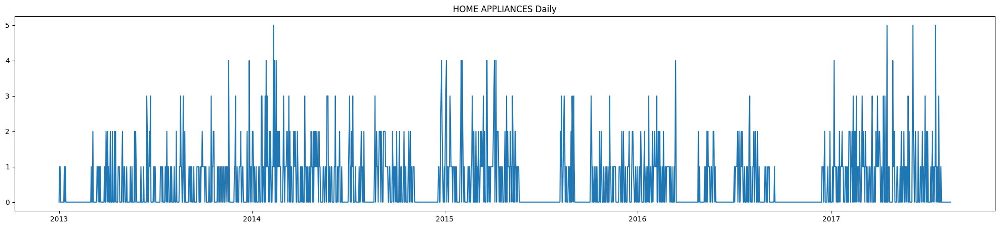

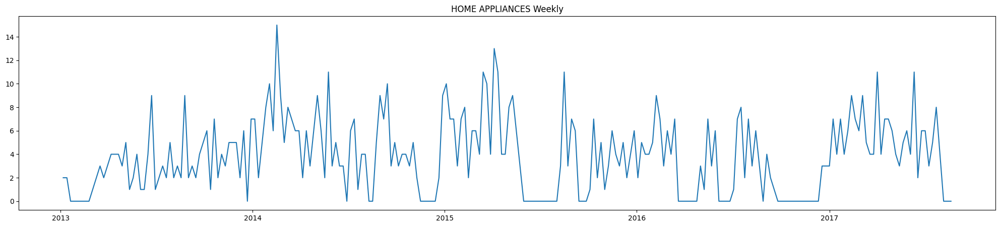

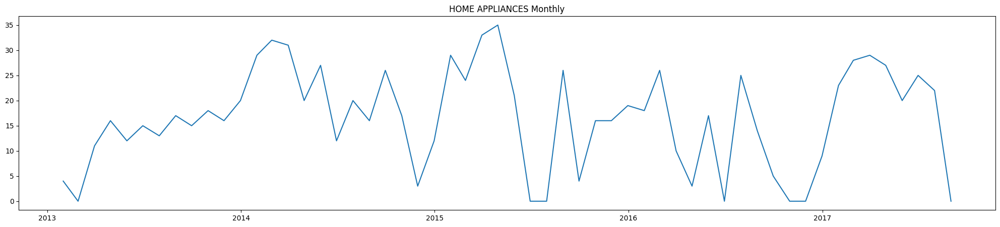

In [16]:
for fam in filtered_fam:
  df_fam_d = df[df['family']==fam]
  df_fam_w = df_filtered_w[fam]
  df_fam_m = df_filtered_m[fam]
  print(f'Plot of {fam}')
  plt.figure(figsize=(25, 5))
  plt.title(f'{fam} Daily')
  plt.plot(df_fam_d.index, df_fam_d['sales'])
  plt.show()
  plt.figure(figsize=(25, 5))
  plt.title(f'{fam} Weekly')
  plt.plot(df_fam_w.index, df_fam_w['sales'])
  plt.show()
  plt.figure(figsize=(25, 5))
  plt.title(f'{fam} Monthly')
  plt.plot(df_fam_m.index, df_fam_m['sales'])
  plt.show()
  print()

**Pemotongan Data**

In [17]:
df_filtered_m['GROCERY I'].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 56 entries, 2013-01-31 to 2017-08-31
Freq: M
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   sales   56 non-null     float64
dtypes: float64(1)
memory usage: 896.0 bytes


In [18]:
df_filtered_w['GROCERY I'].drop(df_filtered_w['GROCERY I'].tail(1).index, inplace=True)
df_filtered_m['GROCERY I'].drop(df_filtered_m['GROCERY I'].tail(1).index, inplace=True)

In [19]:
df_filtered_w['GROCERY II'].tail()

,sales
date,
2017-07-23,729.0
2017-07-30,636.0
2017-08-06,437.0
2017-08-13,211.0
2017-08-20,38.0


In [20]:
df_filtered_w['GROCERY II'].drop(df_filtered_w['GROCERY II'].tail(1).index, inplace=True)
df_filtered_m['GROCERY II'].drop(df_filtered_m['GROCERY II'].tail(1).index, inplace=True)

In [21]:
df_filtered_w['HARDWARE'].tail()

,sales
date,
2017-07-23,10.0
2017-07-30,7.0
2017-08-06,8.0
2017-08-13,13.0
2017-08-20,1.0


In [22]:
df_filtered_w['HARDWARE'].drop(df_filtered_w['HARDWARE'].tail(1).index, inplace=True)
df_filtered_m['HARDWARE'].drop(df_filtered_m['HARDWARE'].tail(1).index, inplace=True)

In [23]:
df_filtered_w['HARDWARE'].describe()

,sales
count,241.000000
mean,7.153527
std,3.377203
min,0.000000
25%,5.000000
50%,7.000000
75%,9.000000
max,22.000000


In [24]:
df_filtered_m['HOME AND KITCHEN I']

,sales
date,
2013-01-31,0.0
2013-02-28,0.0
2013-03-31,0.0
2013-04-30,0.0
2013-05-31,0.0
2013-06-30,0.0
2013-07-31,0.0
2013-08-31,0.0
2013-09-30,0.0


In [25]:
df_filtered_w['HOME AND KITCHEN I'].drop(df_filtered_w['HOME AND KITCHEN I'].loc[:'2014-08-31'].index, inplace=True)
df_filtered_m['HOME AND KITCHEN I'].drop(df_filtered_m['HOME AND KITCHEN I'].loc[:'2014-08-31'].index, inplace=True)

In [26]:
df_filtered_w['HOME AND KITCHEN I'].drop(df_filtered_w['HOME AND KITCHEN I'].tail(1).index, inplace=True)
df_filtered_m['HOME AND KITCHEN I'].drop(df_filtered_m['HOME AND KITCHEN I'].tail(1).index, inplace=True)

In [27]:
df_filtered_w['HOME AND KITCHEN II'].tail()

,sales
date,
2017-07-23,179.0
2017-07-30,146.0
2017-08-06,137.0
2017-08-13,132.0
2017-08-20,43.0


In [28]:
df_filtered_w['HOME AND KITCHEN II'].drop(df_filtered_w['HOME AND KITCHEN II'].loc[:'2014-08-31'].index, inplace=True)
df_filtered_m['HOME AND KITCHEN II'].drop(df_filtered_m['HOME AND KITCHEN II'].loc[:'2014-08-31'].index, inplace=True)

In [29]:
df_filtered_w['HOME AND KITCHEN II'].drop(df_filtered_w['HOME AND KITCHEN II'].tail(1).index, inplace=True)
df_filtered_m['HOME AND KITCHEN II'].drop(df_filtered_m['HOME AND KITCHEN II'].tail(1).index, inplace=True)

In [30]:
df_filtered_w['HOME APPLIANCES'].tail()

,sales
date,
2017-07-23,8.0
2017-07-30,4.0
2017-08-06,0.0
2017-08-13,0.0
2017-08-20,0.0


In [31]:
df_filtered_w['HOME APPLIANCES'].drop(df_filtered_w['HOME APPLIANCES'].loc['2017-07-30':].index, inplace=True)
df_filtered_m['HOME APPLIANCES'].drop(df_filtered_m['HOME APPLIANCES'].tail(1).index, inplace=True)

In [32]:
df_filtered_w['HOME APPLIANCES'].tail()

,sales
date,
2017-06-25,6.0
2017-07-02,6.0
2017-07-09,3.0
2017-07-16,5.0
2017-07-23,8.0


In [33]:
for fam in filtered_fam:
  print(fam)
  print(df_filtered_w[fam].head())
  print()

GROCERY I
              sales
date               
2013-01-06  18944.0
2013-01-13  20129.0
2013-01-20  19418.0
2013-01-27  19097.0
2013-02-03  21082.0

GROCERY II
            sales
date             
2013-01-06   75.0
2013-01-13  105.0
2013-01-20  120.0
2013-01-27   80.0
2013-02-03  126.0

HARDWARE
            sales
date             
2013-01-06    7.0
2013-01-13   10.0
2013-01-20    7.0
2013-01-27    0.0
2013-02-03    5.0

HOME AND KITCHEN I
            sales
date             
2014-09-07  245.0
2014-09-14  240.0
2014-09-21  218.0
2014-09-28  129.0
2014-10-05  113.0

HOME AND KITCHEN II
            sales
date             
2014-09-07  129.0
2014-09-14   93.0
2014-09-21   96.0
2014-09-28  100.0
2014-10-05  107.0

HOME APPLIANCES
            sales
date             
2013-01-06    2.0
2013-01-13    2.0
2013-01-20    0.0
2013-01-27    0.0
2013-02-03    0.0



Plot of GROCERY I


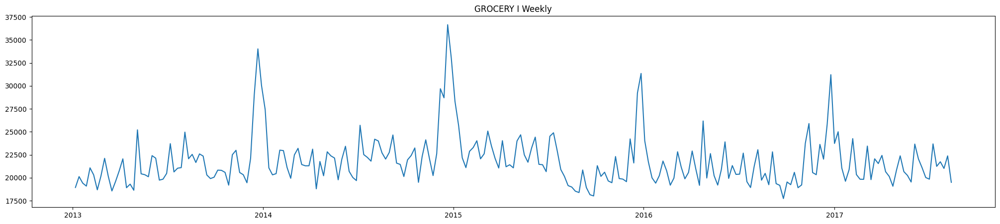

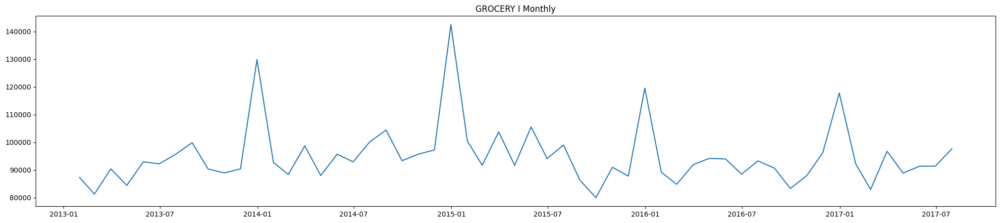


Plot of GROCERY II


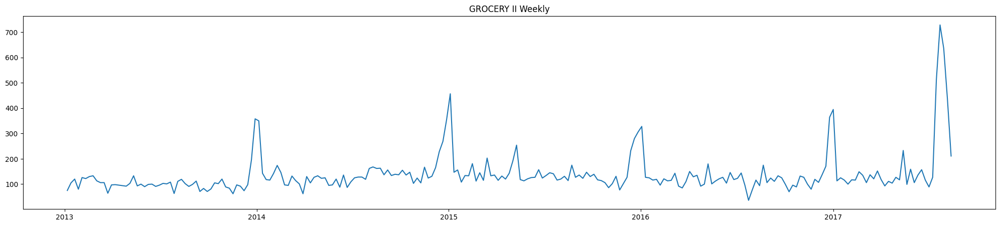

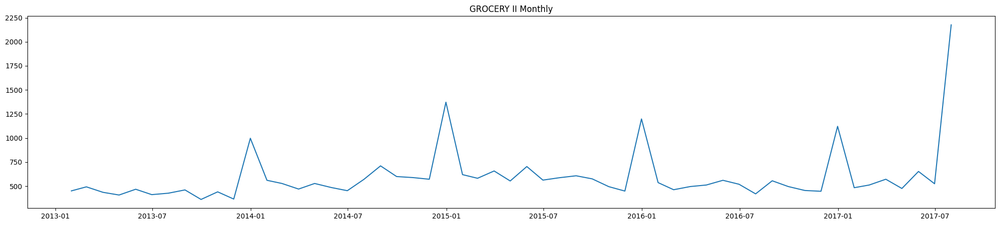


Plot of HARDWARE


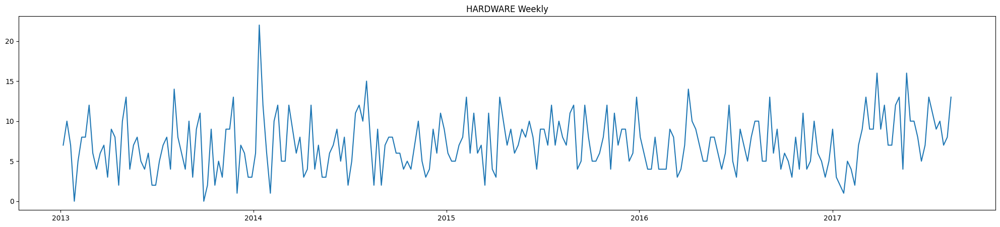

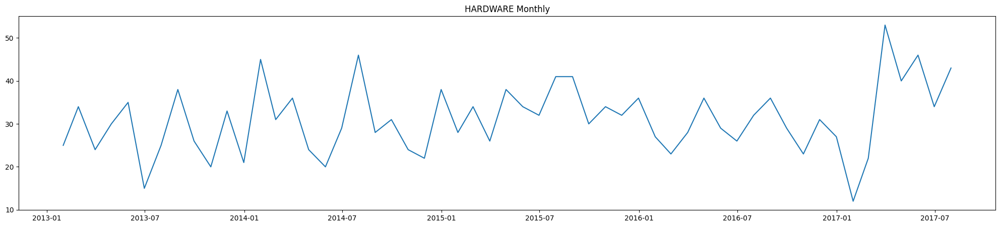


Plot of HOME AND KITCHEN I


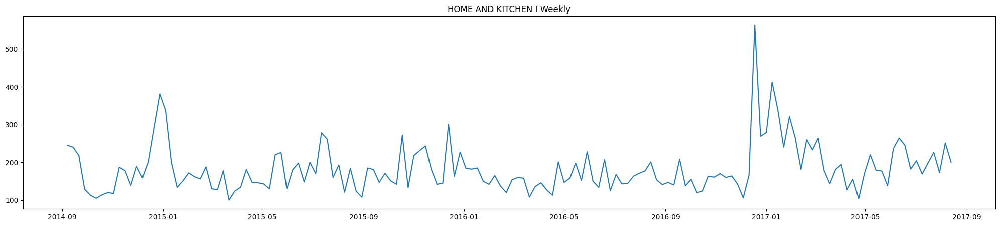

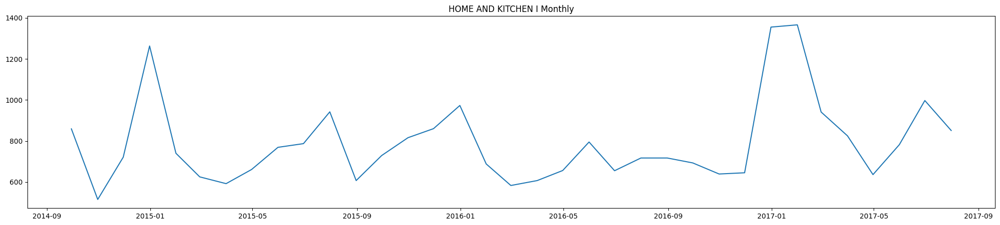


Plot of HOME AND KITCHEN II


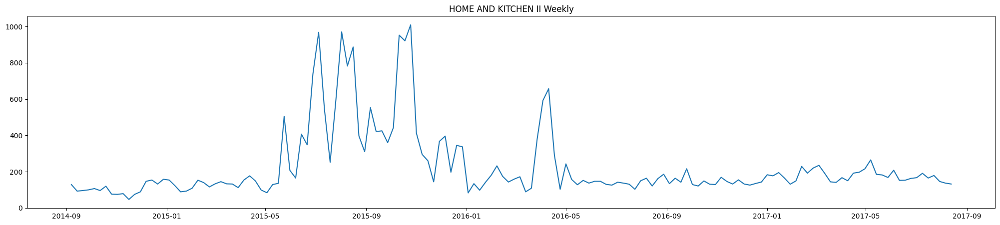

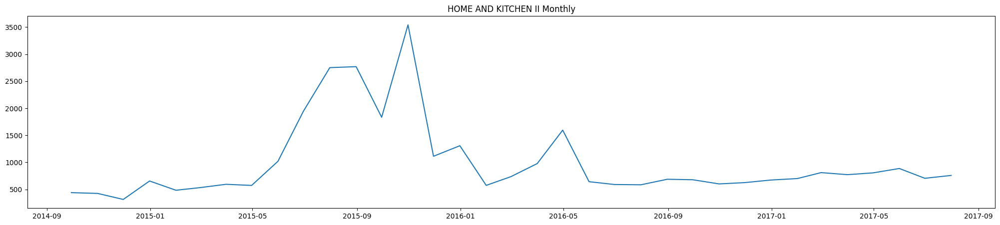


Plot of HOME APPLIANCES


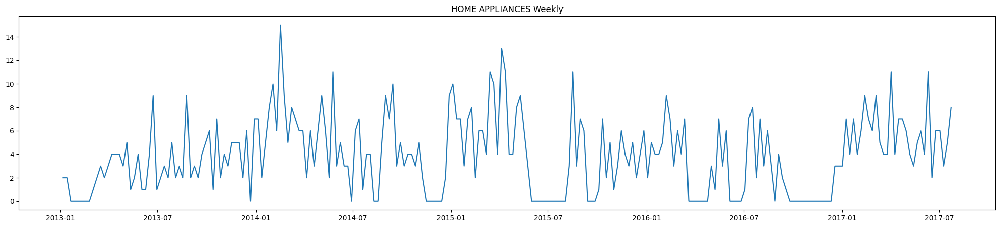

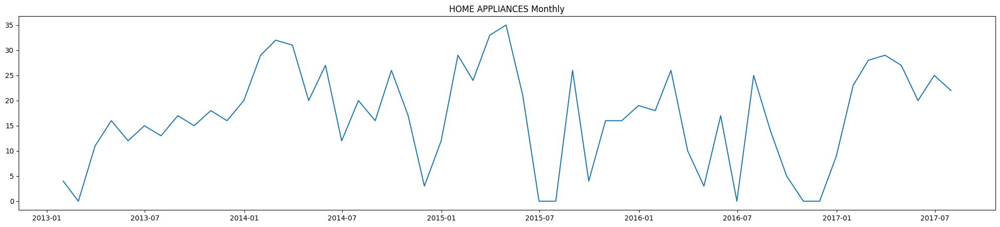

In [34]:
for fam in filtered_fam:
  df_fam_w = df_filtered_w[fam]
  df_fam_m = df_filtered_m[fam]
  print(f'Plot of {fam}')
  plt.figure(figsize=(25, 5))
  plt.title(f'{fam} Weekly')
  plt.plot(df_fam_w.index, df_fam_w['sales'])
  plt.show()
  plt.figure(figsize=(25, 5))
  plt.title(f'{fam} Monthly')
  plt.plot(df_fam_m.index, df_fam_m['sales'])
  plt.show()
  print()

In [35]:
from statsmodels.tsa.seasonal import seasonal_decompose

Decomposition of GROCERY I
Decomposition of GROCERY II
Decomposition of HARDWARE
Decomposition of HOME AND KITCHEN I
Decomposition of HOME AND KITCHEN II
Decomposition of HOME APPLIANCES


<Figure size 2500x1500 with 0 Axes>

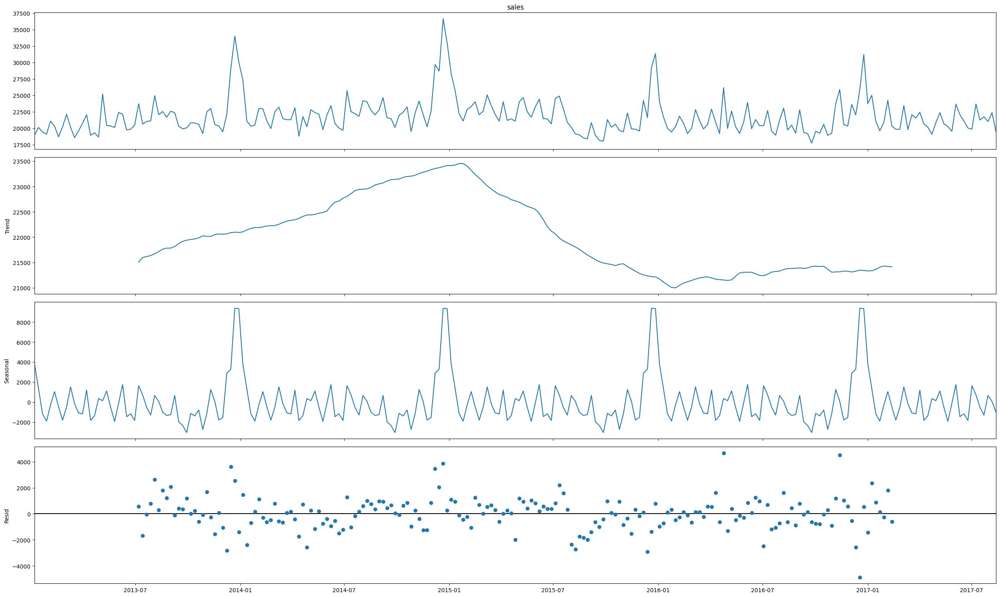

<Figure size 2500x1500 with 0 Axes>

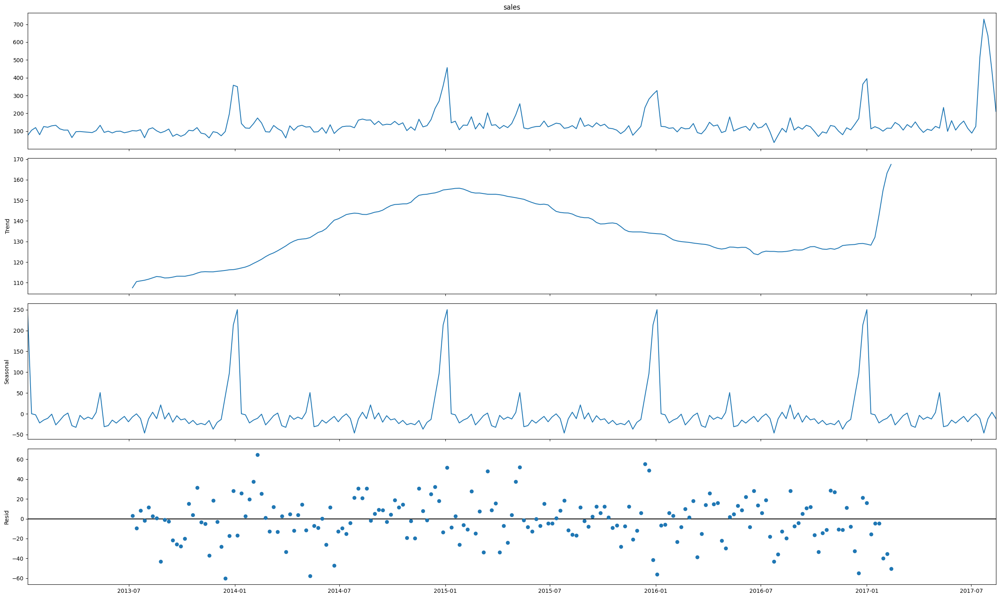

<Figure size 2500x1500 with 0 Axes>

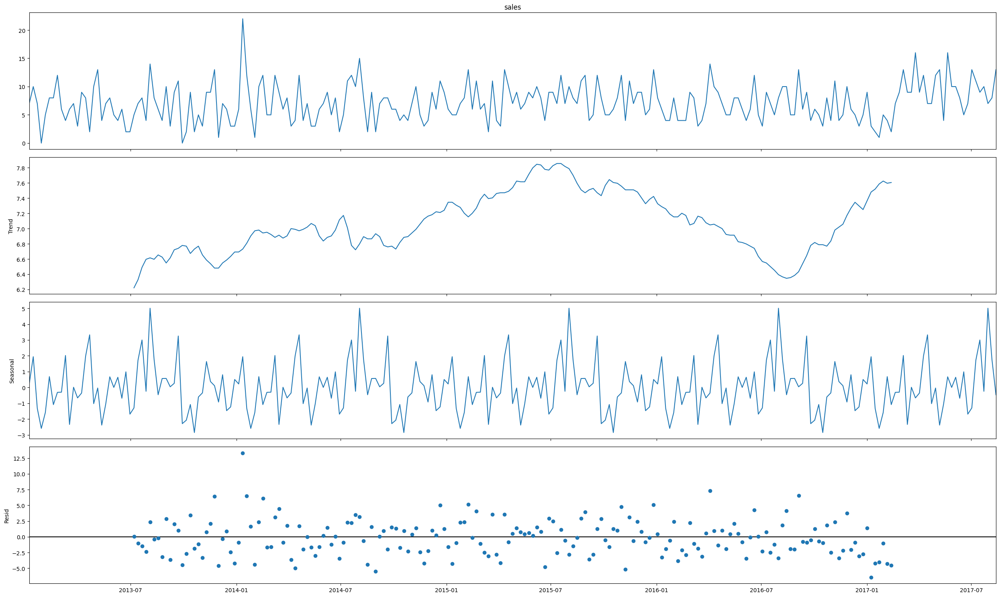

<Figure size 2500x1500 with 0 Axes>

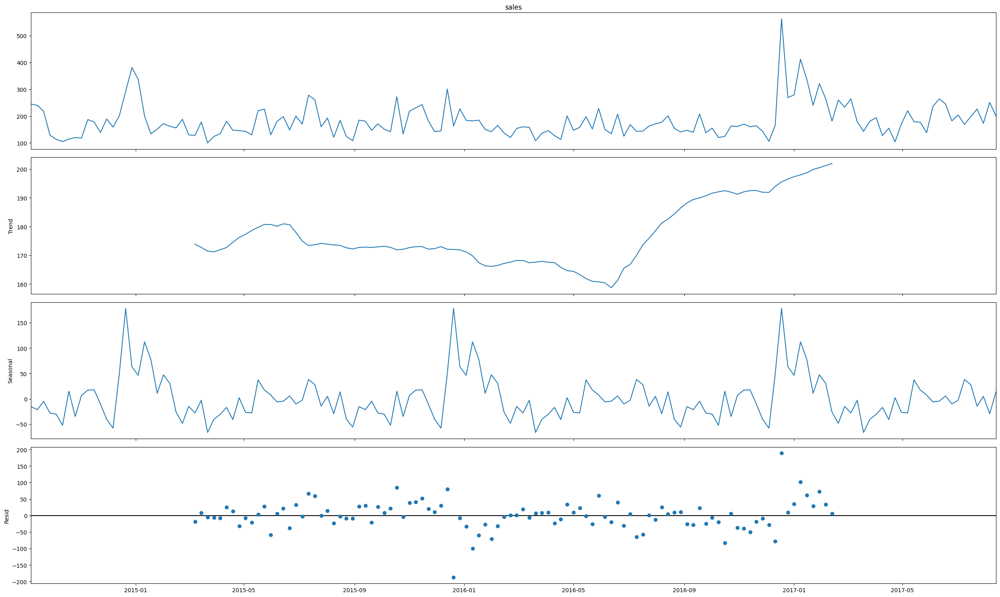

<Figure size 2500x1500 with 0 Axes>

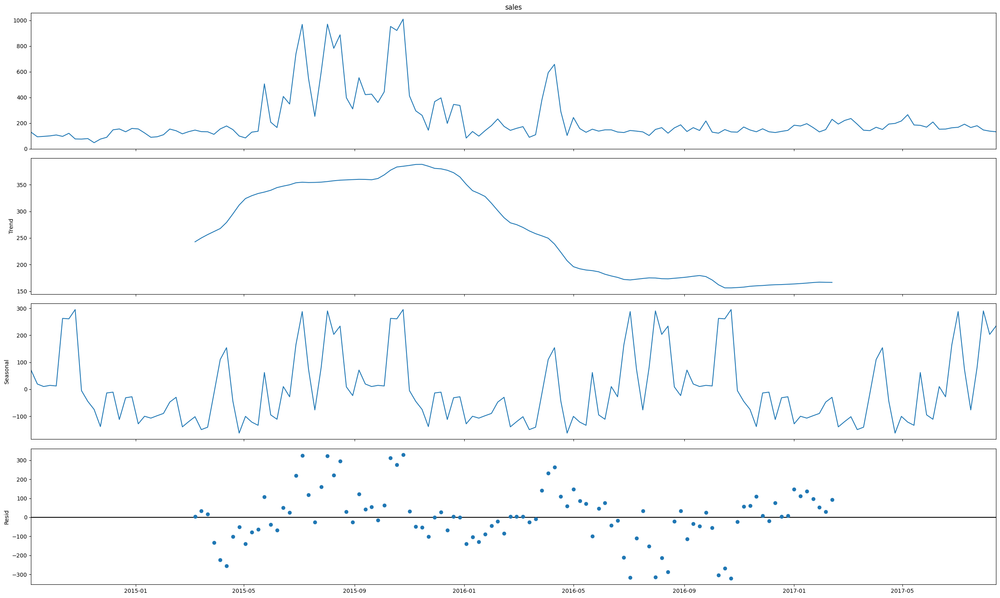

<Figure size 2500x1500 with 0 Axes>

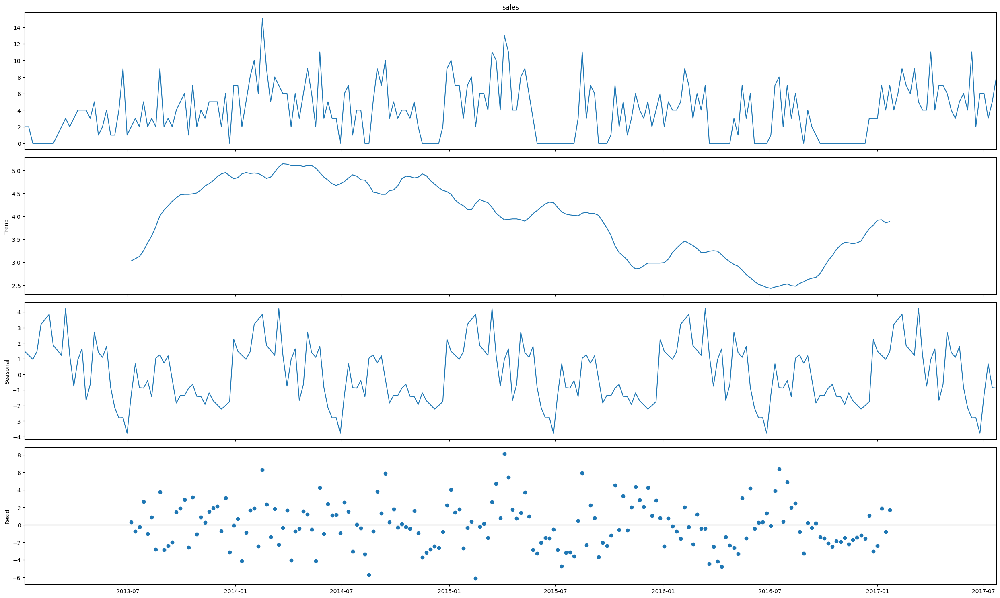

In [36]:
for fam in filtered_fam:
  print(f'Decomposition of {fam}')
  # Make fig size bigger
  plt.rcParams['figure.figsize'] = (25, 15)
  # Decompose time series
  decomposition = seasonal_decompose(df_filtered_w[fam]['sales'], model='additive', period=52)
  fig = plt.figure()
  fig = decomposition.plot()

Decomposition of GROCERY I
Decomposition of GROCERY II
Decomposition of HARDWARE
Decomposition of HOME AND KITCHEN I
Decomposition of HOME AND KITCHEN II
Decomposition of HOME APPLIANCES


<Figure size 2500x1500 with 0 Axes>

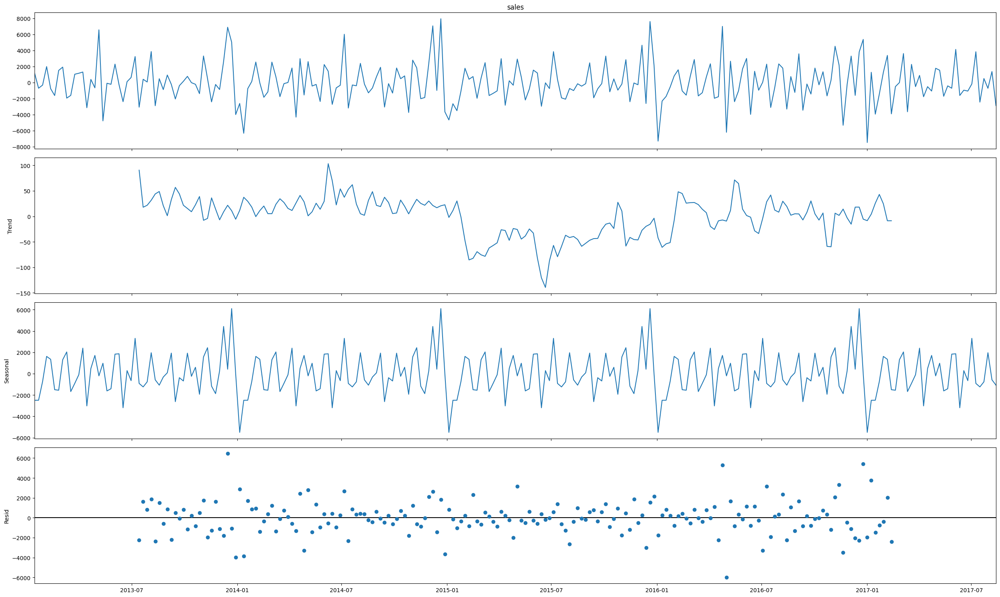

<Figure size 2500x1500 with 0 Axes>

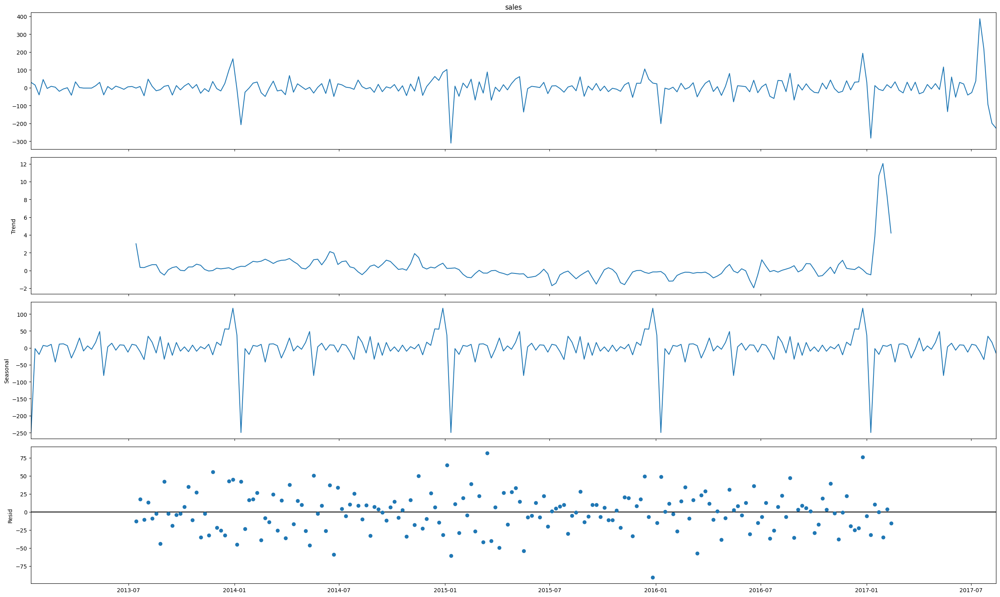

<Figure size 2500x1500 with 0 Axes>

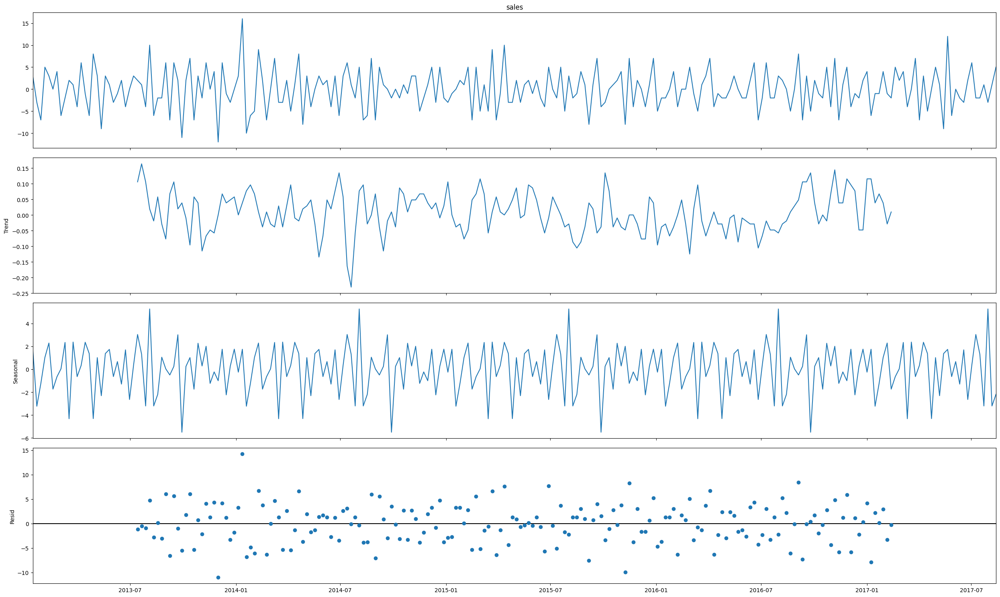

<Figure size 2500x1500 with 0 Axes>

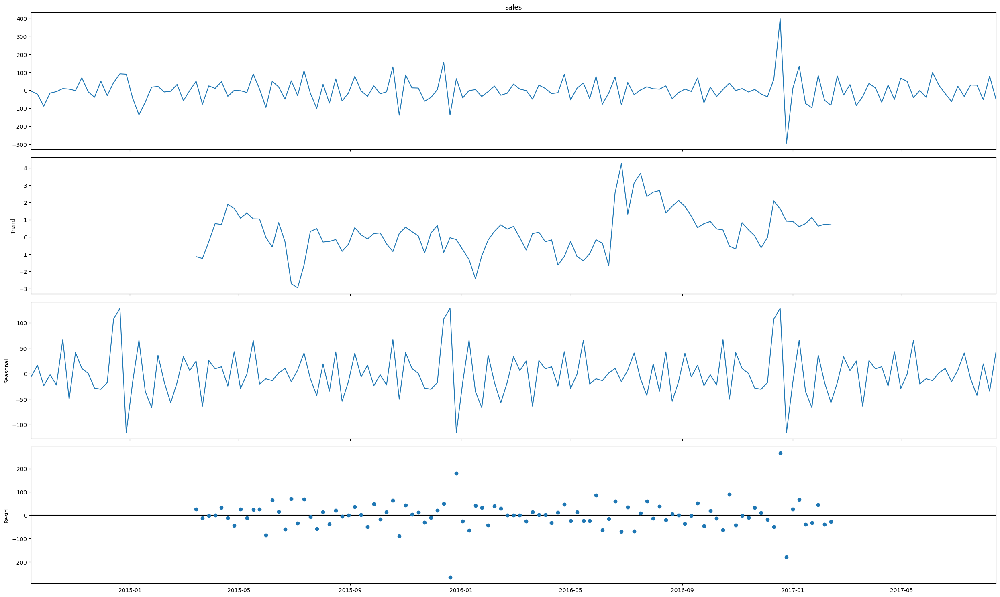

<Figure size 2500x1500 with 0 Axes>

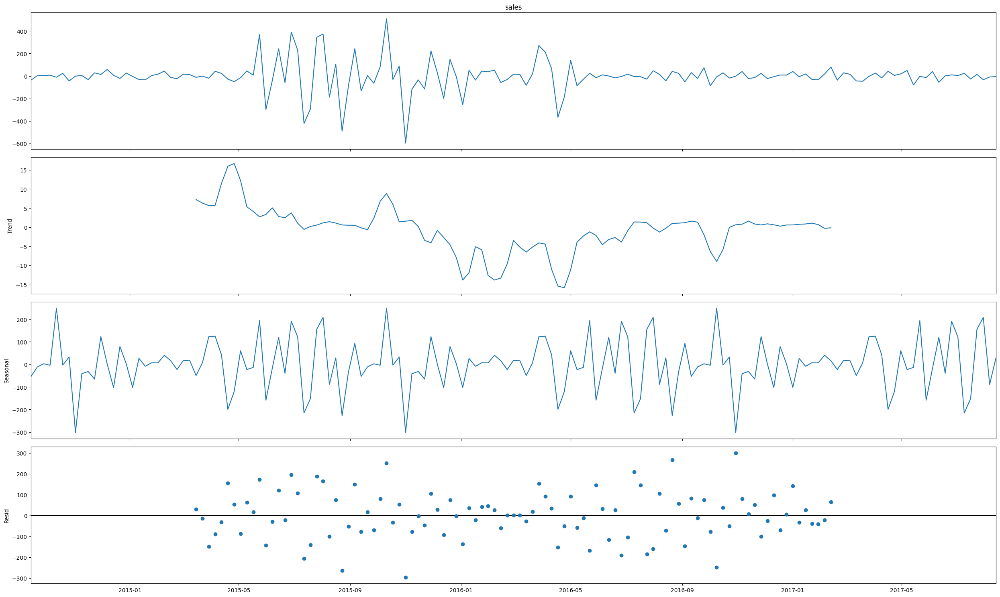

<Figure size 2500x1500 with 0 Axes>

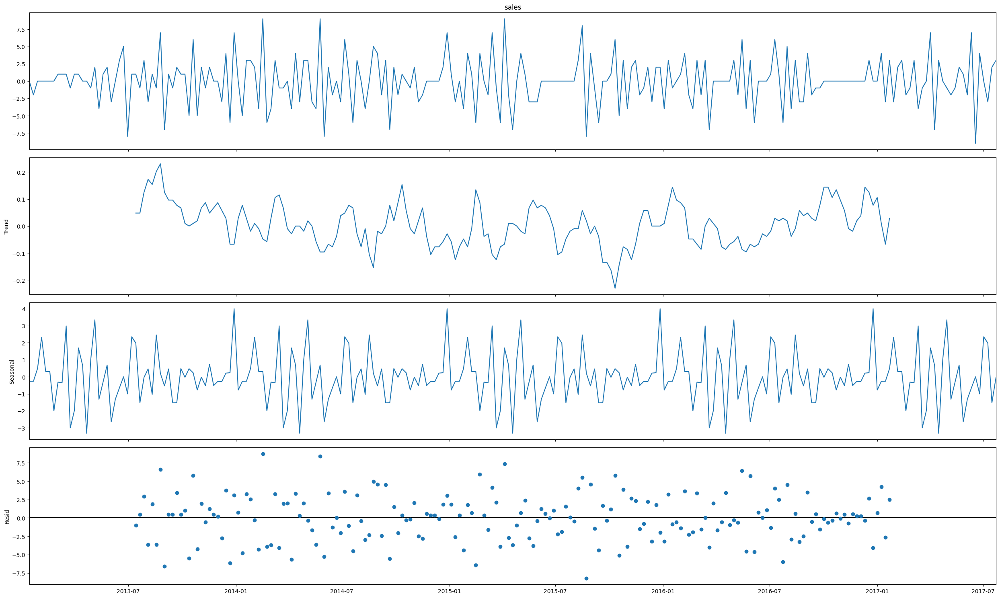

In [37]:
for fam in filtered_fam:
  print(f'Decomposition of {fam}')
  # Make fig size bigger
  plt.rcParams['figure.figsize'] = (25, 15)
  # Decompose time series
  decomposition = seasonal_decompose(df_filtered_w[fam]['sales'].diff().dropna(), model='additive', period=52)
  fig = plt.figure()
  fig = decomposition.plot()


In [38]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller


GROCERY I
ADF Statistic: -8.030811
p-value: 0.000000
Critical Values:
	1%: -3.458
	5%: -2.874
	10%: -2.573
The series is stationary


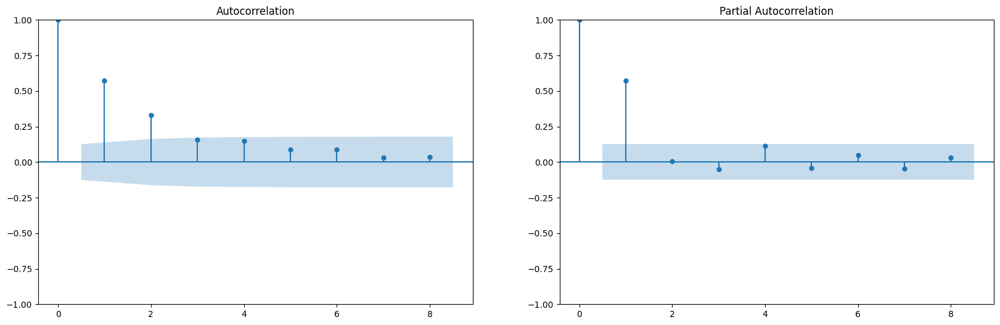


GROCERY II
ADF Statistic: -7.352787
p-value: 0.000000
Critical Values:
	1%: -3.458
	5%: -2.874
	10%: -2.573
The series is stationary


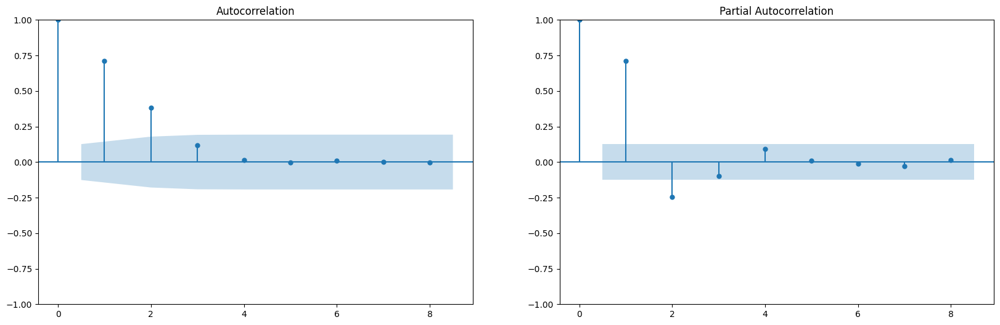


HARDWARE
ADF Statistic: -13.680496
p-value: 0.000000
Critical Values:
	1%: -3.458
	5%: -2.874
	10%: -2.573
The series is stationary


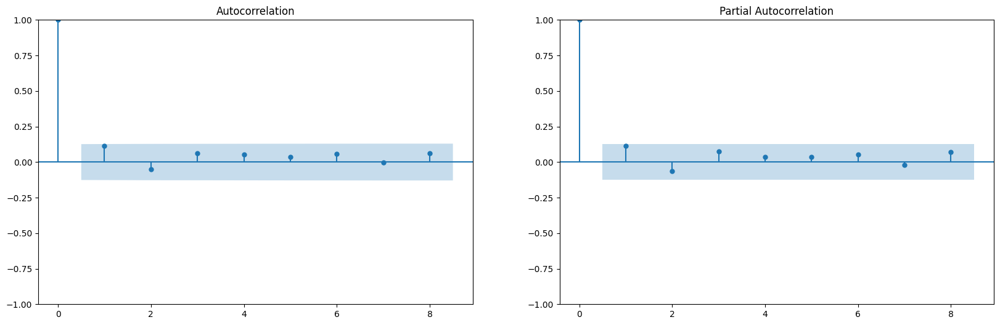


HOME AND KITCHEN I
ADF Statistic: -4.332700
p-value: 0.000390
Critical Values:
	1%: -3.474
	5%: -2.881
	10%: -2.577
The series is stationary


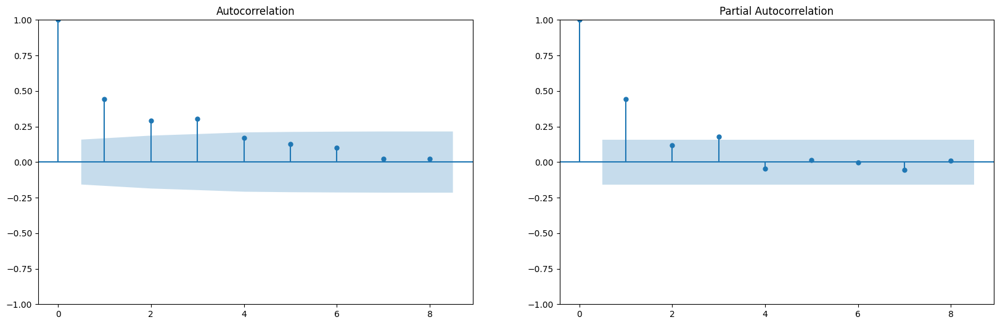


HOME AND KITCHEN II
ADF Statistic: -2.273650
p-value: 0.180607
Critical Values:
	1%: -3.477
	5%: -2.882
	10%: -2.578
The series is non-stationary


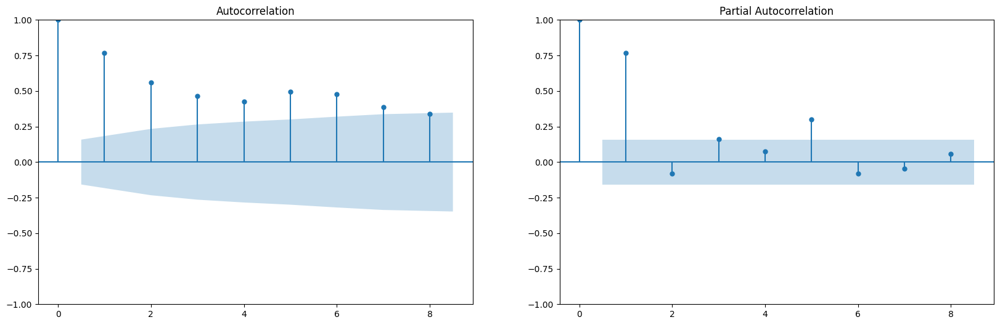


HOME APPLIANCES
ADF Statistic: -4.986335
p-value: 0.000024
Critical Values:
	1%: -3.458
	5%: -2.874
	10%: -2.573
The series is stationary


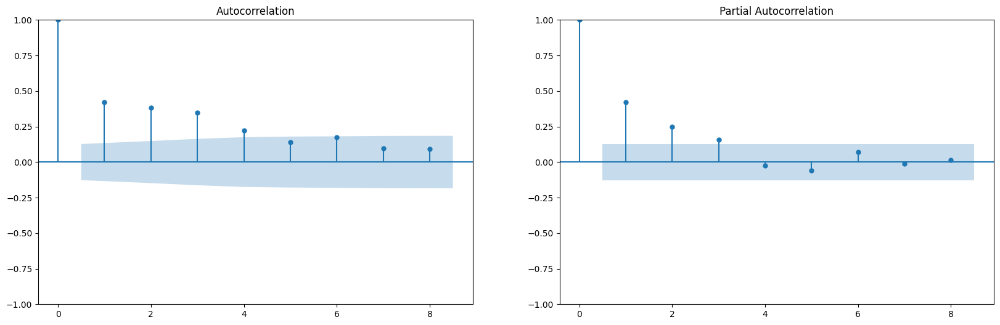

In [39]:
for fam in filtered_fam:
    data = df_filtered_w[fam].copy()
    data = pd.DataFrame(data['sales'])
    result = adfuller(data['sales'])

    adf_statistic = result[0]
    p_value = result[1]
    critical_values = result[4]

    print(f'\n{fam}')
    print('ADF Statistic: %f' % adf_statistic)
    print('p-value: %f' % p_value)
    print('Critical Values:')
    for key, value in critical_values.items():
        print('\t%s: %.3f' % (key, value))

    if p_value <= 0.05:
        print('The series is stationary')
    else:
        print('The series is non-stationary')

    fig, ax = plt.subplots(1, 2, figsize=(20, 6))
    plot_acf(data, lags=8, ax=ax[0])
    plot_pacf(data, lags=8, ax=ax[1])
    plt.show()


GROCERY I
ADF Statistic (Differenced): -6.627891
p-value: 0.000000
Critical Values:
	1%: -3.460
	5%: -2.875
	10%: -2.574
The differenced series is stationary


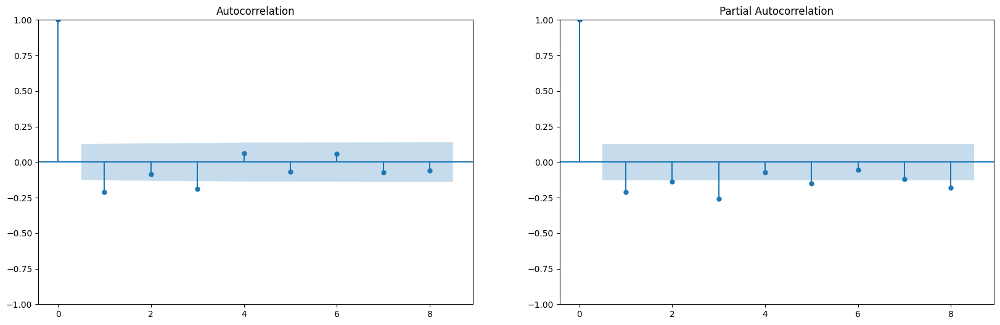


GROCERY II
ADF Statistic (Differenced): -8.252846
p-value: 0.000000
Critical Values:
	1%: -3.459
	5%: -2.874
	10%: -2.573
The differenced series is stationary


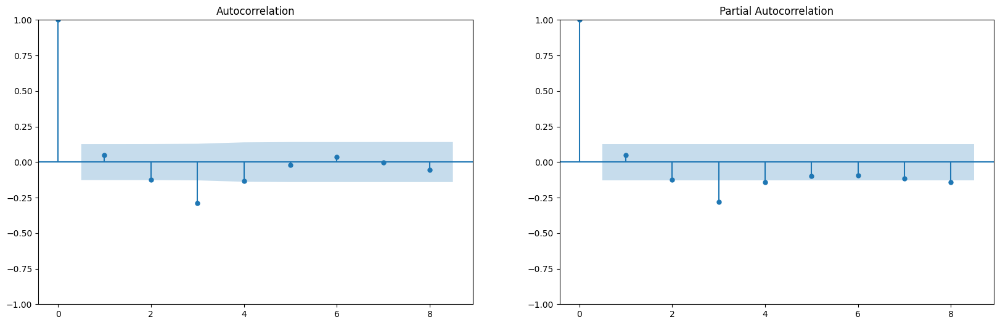


HARDWARE
ADF Statistic (Differenced): -10.181047
p-value: 0.000000
Critical Values:
	1%: -3.459
	5%: -2.874
	10%: -2.573
The differenced series is stationary


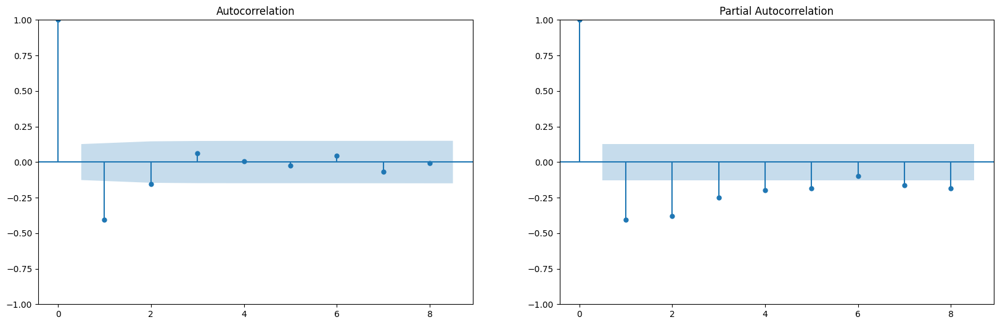


HOME AND KITCHEN I
ADF Statistic (Differenced): -14.113049
p-value: 0.000000
Critical Values:
	1%: -3.474
	5%: -2.881
	10%: -2.577
The differenced series is stationary


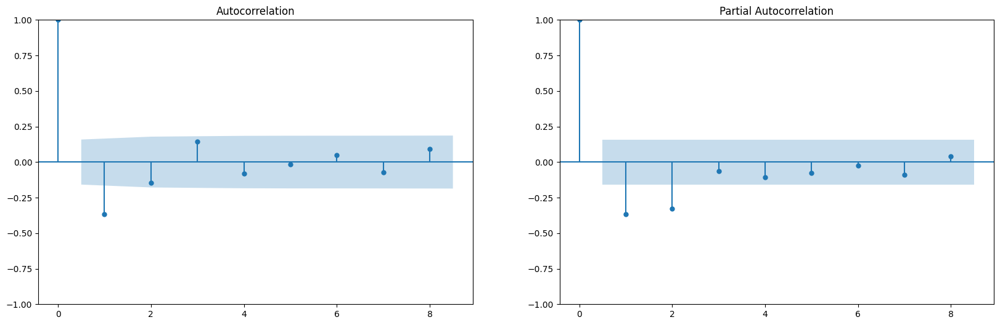


HOME AND KITCHEN II
ADF Statistic (Differenced): -4.146092
p-value: 0.000812
Critical Values:
	1%: -3.477
	5%: -2.882
	10%: -2.578
The differenced series is stationary


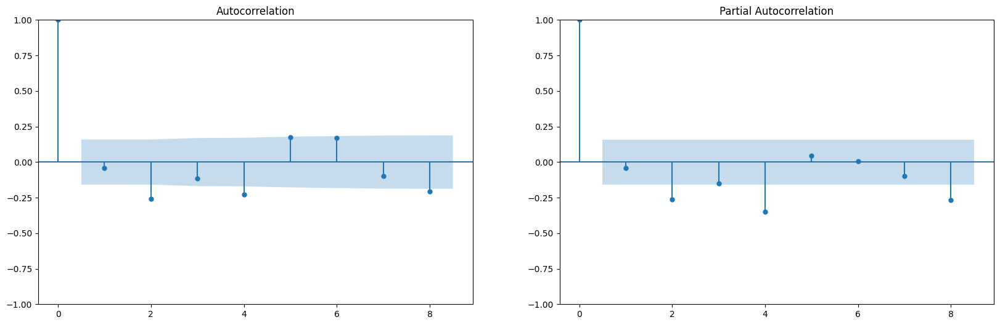


HOME APPLIANCES
ADF Statistic (Differenced): -9.707423
p-value: 0.000000
Critical Values:
	1%: -3.459
	5%: -2.874
	10%: -2.573
The differenced series is stationary


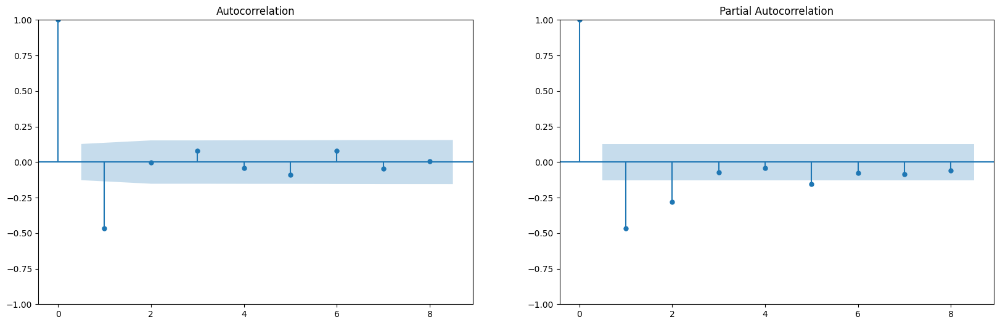

In [40]:
for fam in filtered_fam:
    data = df_filtered_w[fam].copy()
    data = pd.DataFrame(data['sales'])

    # Differencing sekali
    differenced_data = data.diff().dropna()

    result = adfuller(differenced_data['sales'])

    adf_statistic = result[0]
    p_value = result[1]
    critical_values = result[4]

    print(f'\n{fam}')
    print('ADF Statistic (Differenced): %f' % adf_statistic)
    print('p-value: %f' % p_value)
    print('Critical Values:')
    for key, value in critical_values.items():
        print('\t%s: %.3f' % (key, value))

    if p_value <= 0.05:
        print('The differenced series is stationary')
    else:
        print('The differenced series is non-stationary')

    fig, ax = plt.subplots(1, 2, figsize=(20, 6))
    plot_acf(differenced_data, lags=8, ax=ax[0])
    plot_pacf(differenced_data, lags=8, ax=ax[1])
    plt.show()

In [41]:
p = {'GROCERY I':1,
     'GROCERY II':2,
     'HARDWARE':0,
     'HOME AND KITCHEN I':1,
     'HOME AND KITCHEN II':0,
     'HOME APPLIANCES':2}
d = {'GROCERY I':0,
     'GROCERY II':0,
     'HARDWARE':0,
     'HOME AND KITCHEN I':0,
     'HOME AND KITCHEN II':1,
     'HOME APPLIANCES':1}
q = {'GROCERY I':2,
     'GROCERY II':2,
     'HARDWARE':0,
     'HOME AND KITCHEN I':3,
     'HOME AND KITCHEN II':0,
     'HOME APPLIANCES':1}

In [42]:
train_size = 0.8
train_data = {}
test_data = {}

for fam in filtered_fam:
  # Tentukan jumlah data untuk train
  train_len = int(len(df_filtered_w[fam]) * train_size)

  # Bagi data menjadi train dan test
  train_data[fam] = df_filtered_w[fam].iloc[:train_len]
  test_data[fam] = df_filtered_w[fam].iloc[train_len:]

In [43]:
for fam in filtered_fam:
  print(f'Panjang Data Train {fam}: {len(train_data[fam])}')
  print(f'Panjang Data Test {fam}: {len(test_data[fam])}')

Panjang Data Train GROCERY I: 192
Panjang Data Test GROCERY I: 49
Panjang Data Train GROCERY II: 192
Panjang Data Test GROCERY II: 49
Panjang Data Train HARDWARE: 192
Panjang Data Test HARDWARE: 49
Panjang Data Train HOME AND KITCHEN I: 123
Panjang Data Test HOME AND KITCHEN I: 31
Panjang Data Train HOME AND KITCHEN II: 123
Panjang Data Test HOME AND KITCHEN II: 31
Panjang Data Train HOME APPLIANCES: 190
Panjang Data Test HOME APPLIANCES: 48


In [44]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, accuracy_score

In [45]:
arima_model_fit = {}
sarima_model_fit = {}
for fam in filtered_fam:
  arima_model = ARIMA(train_data[fam], order=(p[fam], d[fam], q[fam]))
  sarima_model = ARIMA(train_data[fam], order=(p[fam], d[fam], q[fam]),seasonal_order=(p[fam], d[fam], q[fam],52))
  arima_model_fit[fam] = arima_model.fit()
  sarima_model_fit[fam] = sarima_model.fit()
  print(f'--ARIMA and SARIMA Model of {fam}--')
  print(arima_model_fit[fam].summary())
  print(sarima_model_fit[fam].summary())

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


--ARIMA and SARIMA Model of GROCERY I--
                               SARIMAX Results                                
Dep. Variable:                  sales   No. Observations:                  192
Model:                 ARIMA(1, 0, 2)   Log Likelihood               -1752.079
Date:                Mon, 24 Jun 2024   AIC                           3514.158
Time:                        11:24:31   BIC                           3530.446
Sample:                    01-06-2013   HQIC                          3520.755
                         - 09-04-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.191e+04    484.995     45.173      0.000     2.1e+04    2.29e+04
ar.L1          0.2997      0.191      1.566      0.117      -0.075       0.675
ma.L1       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


--ARIMA and SARIMA Model of GROCERY II--
                               SARIMAX Results                                
Dep. Variable:                  sales   No. Observations:                  192
Model:                 ARIMA(2, 0, 2)   Log Likelihood                -990.635
Date:                Mon, 24 Jun 2024   AIC                           1993.269
Time:                        11:25:38   BIC                           2012.814
Sample:                    01-06-2013   HQIC                          2001.185
                         - 09-04-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        129.2961     11.085     11.664      0.000     107.571     151.021
ar.L1         -0.2560      0.220     -1.166      0.244      -0.686       0.174
ar.L2      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


--ARIMA and SARIMA Model of HOME AND KITCHEN I--
                               SARIMAX Results                                
Dep. Variable:                  sales   No. Observations:                  123
Model:                 ARIMA(1, 0, 3)   Log Likelihood                -672.901
Date:                Mon, 24 Jun 2024   AIC                           1357.802
Time:                        11:26:39   BIC                           1374.675
Sample:                    09-07-2014   HQIC                          1364.656
                         - 01-08-2017                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        177.5599     14.819     11.982      0.000     148.516     206.604
ar.L1          0.1651      0.527      0.313      0.754      -0.868       1.198
ma.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


--ARIMA and SARIMA Model of HOME APPLIANCES--
                               SARIMAX Results                                
Dep. Variable:                  sales   No. Observations:                  190
Model:                 ARIMA(2, 1, 1)   Log Likelihood                -466.775
Date:                Mon, 24 Jun 2024   AIC                            941.549
Time:                        11:27:39   BIC                            954.516
Sample:                    01-06-2013   HQIC                           946.802
                         - 08-21-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3170      0.075      4.233      0.000       0.170       0.464
ar.L2          0.2146      0.066      3.232      0.001       0.084       0.345
ma.L1 

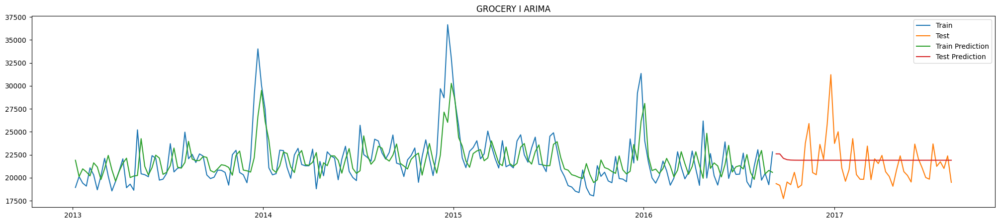

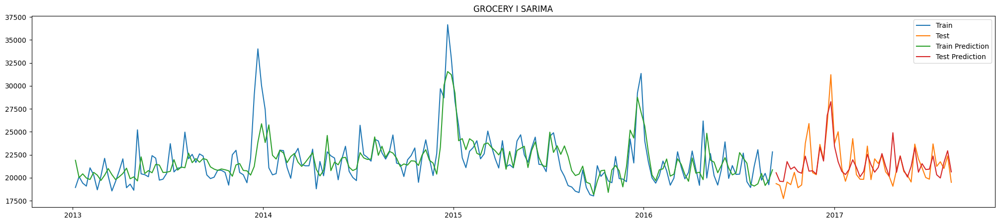

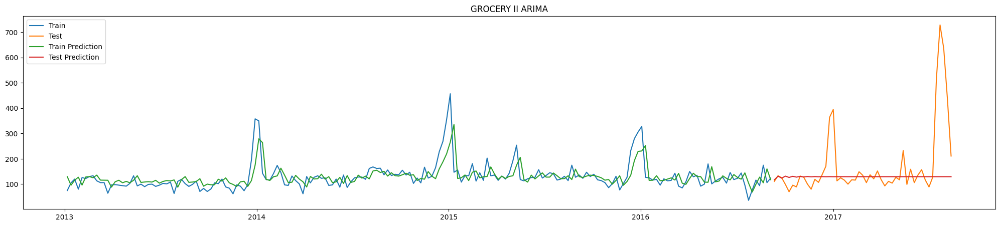

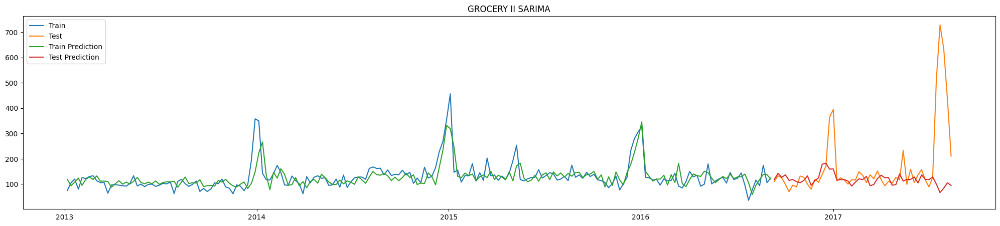

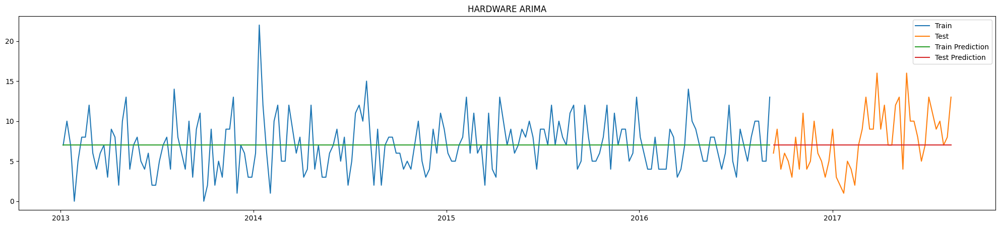

...

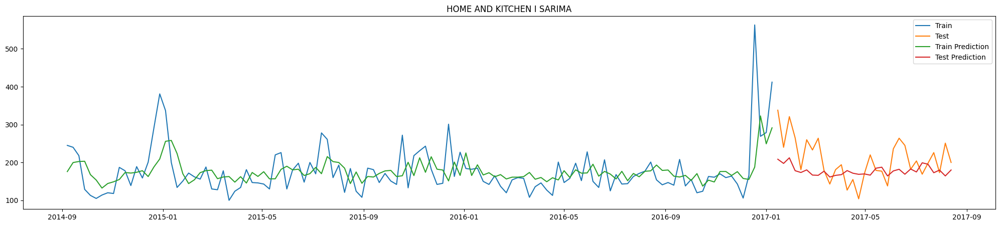

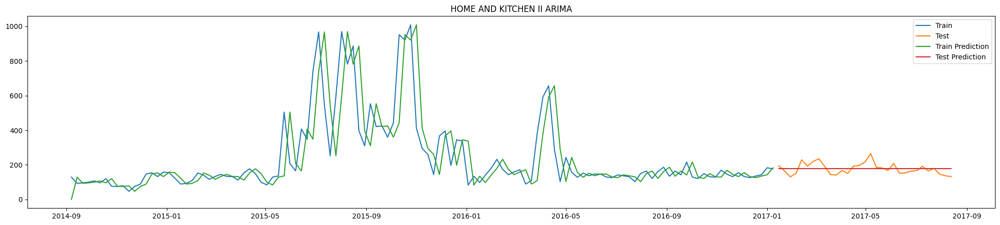

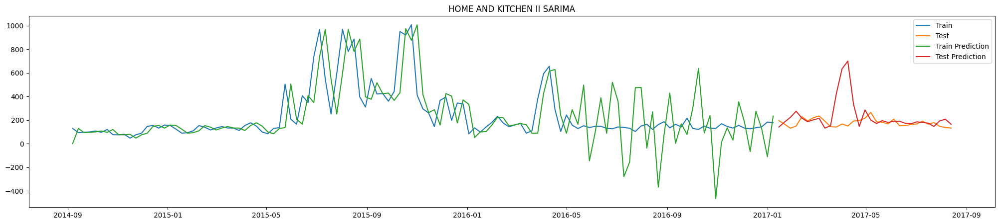

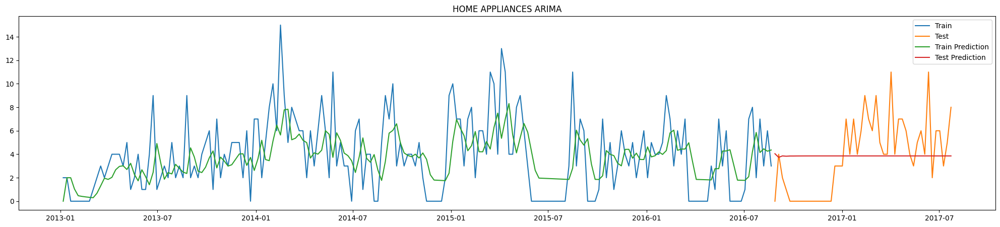

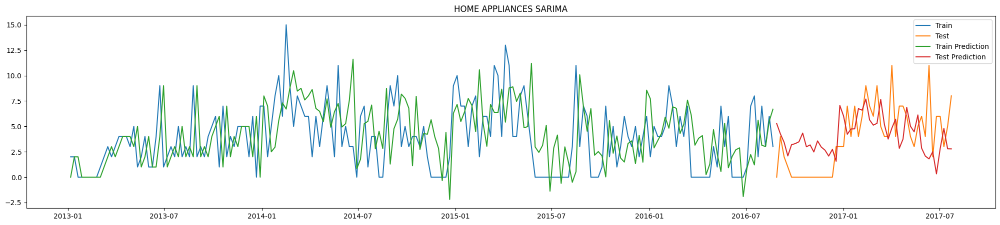

In [46]:
# prompt: visualisasi hasil prediksi train dan prediksi test dari model arima dan sarima di 2 plot berbeda

import matplotlib.pyplot as plt
for fam in filtered_fam:
  # Plot hasil prediksi train dan test dari model arima dan sarima di 2 plot berbeda
  plt.figure(figsize=(25, 5))
  plt.title(f'{fam} ARIMA')
  plt.plot(train_data[fam].index, train_data[fam]['sales'], label='Train')
  plt.plot(test_data[fam].index, test_data[fam]['sales'], label='Test')
  plt.plot(train_data[fam].index, arima_model_fit[fam].predict(start=0, end=len(train_data[fam])-1), label='Train Prediction')
  plt.plot(test_data[fam].index, arima_model_fit[fam].predict(start=len(train_data[fam]), end=len(train_data[fam])+len(test_data[fam])-1), label='Test Prediction')
  plt.legend()
  plt.show()
  plt.figure(figsize=(25, 5))
  plt.title(f'{fam} SARIMA')
  plt.plot(train_data[fam].index, train_data[fam]['sales'], label='Train')
  plt.plot(test_data[fam].index, test_data[fam]['sales'], label='Test')
  plt.plot(train_data[fam].index, sarima_model_fit[fam].predict(start=0, end=len(train_data[fam])-1), label='Train Prediction')
  plt.plot(test_data[fam].index, sarima_model_fit[fam].predict(start=len(train_data[fam]), end=len(train_data[fam])+len(test_data[fam])-1), label='Test Prediction')
  plt.legend()
  plt.show()

In [76]:
arima_test_rmse = {}
sarima_test_rmse = {}
for fam in filtered_fam:
  # RMSE data train
  arima_train_rmse = mean_squared_error(train_data[fam]['sales'], arima_model_fit[fam].predict(start=0, end=len(train_data[fam])-1))**0.5
  sarima_train_rmse = mean_squared_error(train_data[fam]['sales'], sarima_model_fit[fam].predict(start=0, end=len(train_data[fam])-1))**0.5
  # RMSE data test
  arima_test_rmse[fam] = mean_squared_error(test_data[fam]['sales'], arima_model_fit[fam].predict(start=len(train_data[fam]), end=len(train_data[fam])+len(test_data[fam])-1))**0.5
  sarima_test_rmse[fam] = mean_squared_error(test_data[fam]['sales'], sarima_model_fit[fam].predict(start=len(train_data[fam]), end=len(train_data[fam])+len(test_data[fam])-1))**0.5
  # Print RMSE
  print(f'RMSE {fam} Train ARIMA: {arima_train_rmse}')
  print(f'RMSE {fam} Train SARIMA: {sarima_train_rmse}')
  print(f'RMSE {fam} Test ARIMA: {arima_test_rmse[fam]}')
  print(f'RMSE {fam} Test SARIMA: {sarima_test_rmse[fam]}')
  print()

RMSE GROCERY I Train ARIMA: 2223.37264187414
RMSE GROCERY I Train SARIMA: 1922.6073399135473
RMSE GROCERY I Test ARIMA: 2434.484091189834
RMSE GROCERY I Test SARIMA: 1624.8667288533675

RMSE GROCERY II Train ARIMA: 42.13654142586899
RMSE GROCERY II Train SARIMA: 36.2986006976345
RMSE GROCERY II Test ARIMA: 144.6258746330371
RMSE GROCERY II Test SARIMA: 154.65192604759287

RMSE HARDWARE Train ARIMA: 3.292836685522864
RMSE HARDWARE Train SARIMA: 3.292836685522864
RMSE HARDWARE Test ARIMA: 3.667592903093279
RMSE HARDWARE Test SARIMA: 3.667592903093279

RMSE HOME AND KITCHEN I Train ARIMA: 57.497642424357124
RMSE HOME AND KITCHEN I Train SARIMA: 56.51143694142948
RMSE HOME AND KITCHEN I Test ARIMA: 52.72533895385852
RMSE HOME AND KITCHEN I Test SARIMA: 56.473854442942915

RMSE HOME AND KITCHEN II Train ARIMA: 146.5868315606551
RMSE HOME AND KITCHEN II Train SARIMA: 199.93048014186297
RMSE HOME AND KITCHEN II Test ARIMA: 32.31298550518142
RMSE HOME AND KITCHEN II Test SARIMA: 147.7991226129

In [51]:
from sklearn.preprocessing import StandardScaler

In [52]:
train_data_scaled = {}
test_data_scaled = {}

scaler = StandardScaler()
for fam in filtered_fam:
  train_data_scaled[fam] = pd.DataFrame(scaler.fit_transform(train_data[fam]), index=train_data[fam].index, columns=train_data[fam].columns)
  test_data_scaled[fam] = pd.DataFrame(scaler.transform(test_data[fam]), index=test_data[fam].index, columns=test_data[fam].columns)

In [53]:
for fam in filtered_fam:
  print(f'Panjang Data Train {fam}: {len(train_data_scaled[fam])}')
  print(f'Panjang Data Test {fam}: {len(test_data_scaled[fam])}')

Panjang Data Train GROCERY I: 192
Panjang Data Test GROCERY I: 49
Panjang Data Train GROCERY II: 192
Panjang Data Test GROCERY II: 49
Panjang Data Train HARDWARE: 192
Panjang Data Test HARDWARE: 49
Panjang Data Train HOME AND KITCHEN I: 123
Panjang Data Test HOME AND KITCHEN I: 31
Panjang Data Train HOME AND KITCHEN II: 123
Panjang Data Test HOME AND KITCHEN II: 31
Panjang Data Train HOME APPLIANCES: 190
Panjang Data Test HOME APPLIANCES: 48


In [54]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

In [55]:
# prompt: membuat model lstm dengan menggunakan data-data yang sudah di scalling

def create_lstm_model(data):
  model = Sequential()
  model.add(LSTM(units=50, return_sequences=True, input_shape=(data.shape[1], 1)))
  model.add(Dropout(0.2))
  model.add(LSTM(units=50, return_sequences=True))
  model.add(Dropout(0.2))
  model.add(LSTM(units=50, return_sequences=True))
  model.add(Dropout(0.2))
  model.add(LSTM(units=50))
  model.add(Dropout(0.2))
  model.add(Dense(units=1))
  model.compile(loss='mean_squared_error', optimizer='adam')
  return model

lstm_models = {}
for fam in filtered_fam:
  lstm_models[fam] = create_lstm_model(train_data_scaled[fam])
  lstm_models[fam].fit(train_data_scaled[fam], train_data_scaled[fam], epochs=50, batch_size=32)
  print(f'Model LSTM {fam} telah dibuat dan dilatih')

Epoch 1/50
6/6 [==============================] - 8s 7ms/step - loss: 1.0001
Epoch 2/50
6/6 [==============================] - 0s 6ms/step - loss: 0.9982
Epoch 3/50
6/6 [==============================] - 0s 6ms/step - loss: 0.9970
Epoch 4/50
6/6 [==============================] - 0s 7ms/step - loss: 0.9921
Epoch 5/50
6/6 [==============================] - 0s 8ms/step - loss: 0.9841
Epoch 6/50
6/6 [==============================] - 0s 6ms/step - loss: 0.9685
Epoch 7/50
6/6 [==============================] - 0s 8ms/step - loss: 0.9349
Epoch 8/50
6/6 [==============================] - 0s 7ms/step - loss: 0.8669
Epoch 9/50
6/6 [==============================] - 0s 6ms/step - loss: 0.7375
Epoch 10/50
6/6 [==============================] - 0s 6ms/step - loss: 0.5396
Epoch 11/50
6/6 [==============================] - 0s 6ms/step - loss: 0.3039
Epoch 12/50
6/6 [==============================] - 0s 6ms/step - loss: 0.1164
Epoch 13/50
6/6 [==============================] - 0s 6ms/step - loss: 0.

2/2 [==============================] - 2s 8ms/step


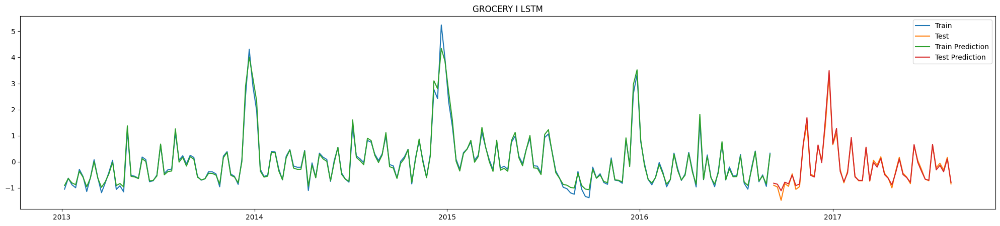

2/2 [==============================] - 2s 10ms/step


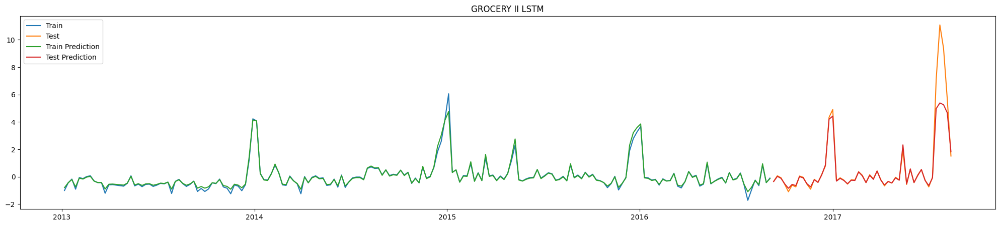

2/2 [==============================] - 2s 7ms/step


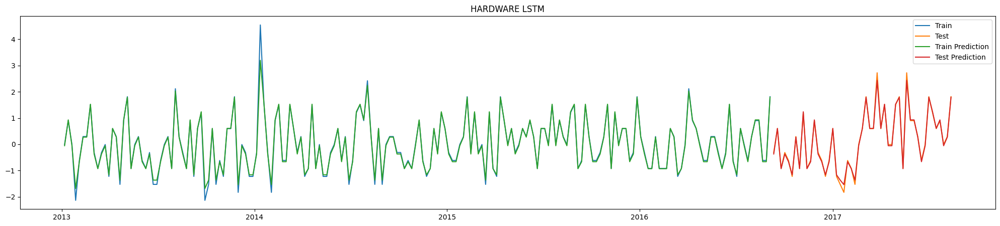

1/1 [==============================] - 0s 25ms/step


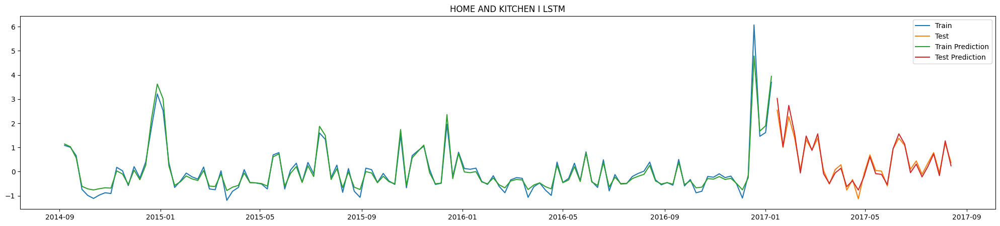

1/1 [==============================] - 0s 34ms/step


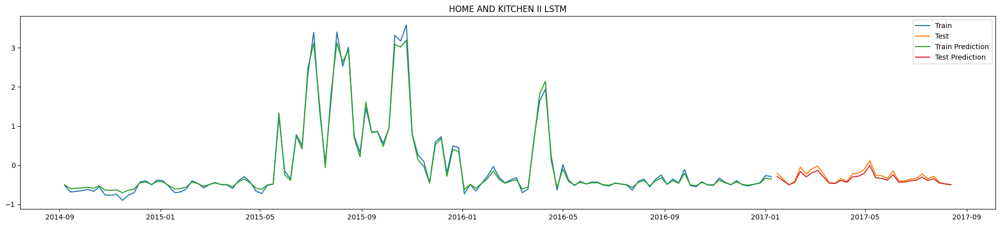

2/2 [==============================] - 0s 14ms/step


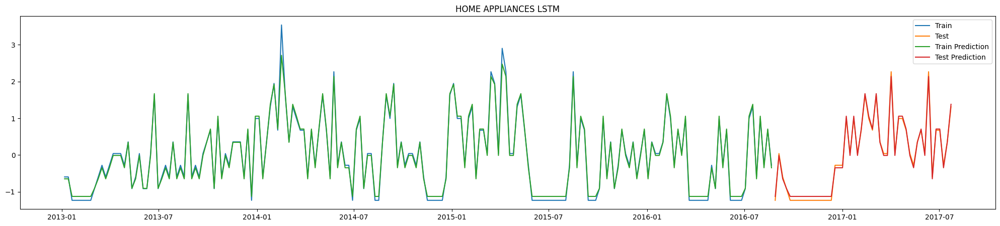

In [56]:
# prompt: visualisasi hasil model lstm

for fam in filtered_fam:
  # Plot hasil prediksi train dan test dari model lstm
  plt.figure(figsize=(25, 5))
  plt.title(f'{fam} LSTM')
  plt.plot(train_data_scaled[fam].index, train_data_scaled[fam]['sales'], label='Train')
  plt.plot(test_data_scaled[fam].index, test_data_scaled[fam]['sales'], label='Test')
  plt.plot(train_data_scaled[fam].index, lstm_models[fam].predict(train_data_scaled[fam]), label='Train Prediction')
  plt.plot(test_data_scaled[fam].index, lstm_models[fam].predict(test_data_scaled[fam]), label='Test Prediction')
  plt.legend()
  plt.show()

2/2 [==============================] - 0s 7ms/step


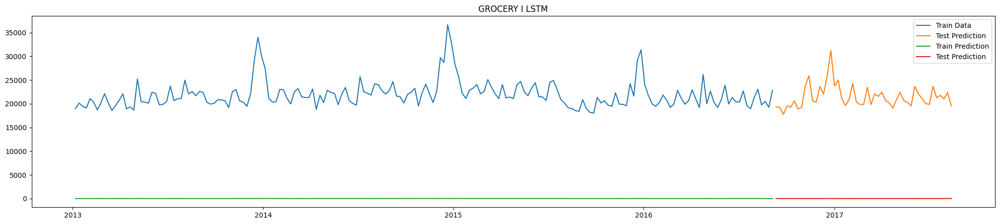

2/2 [==============================] - 0s 7ms/step


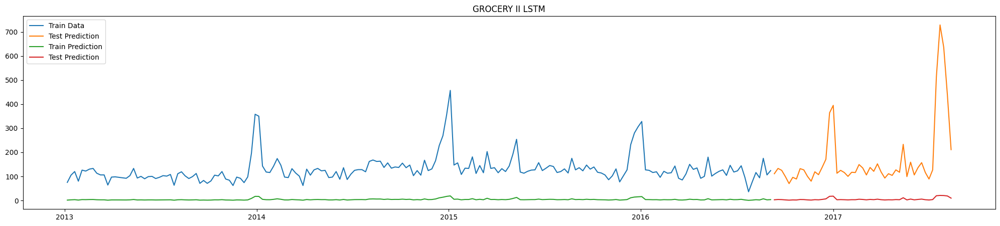

2/2 [==============================] - 0s 7ms/step


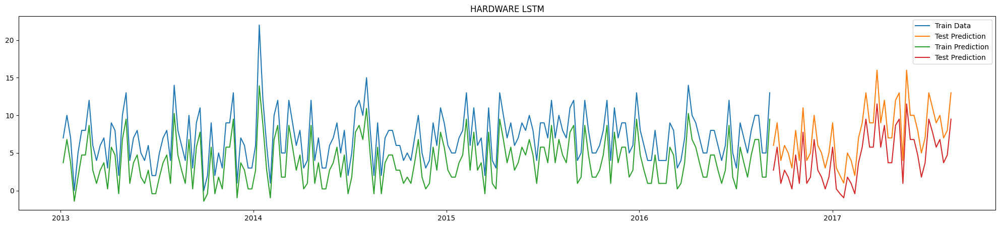

1/1 [==============================] - 0s 22ms/step


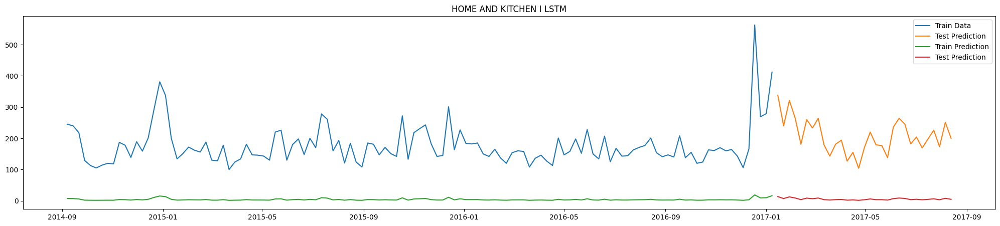

1/1 [==============================] - 0s 21ms/step


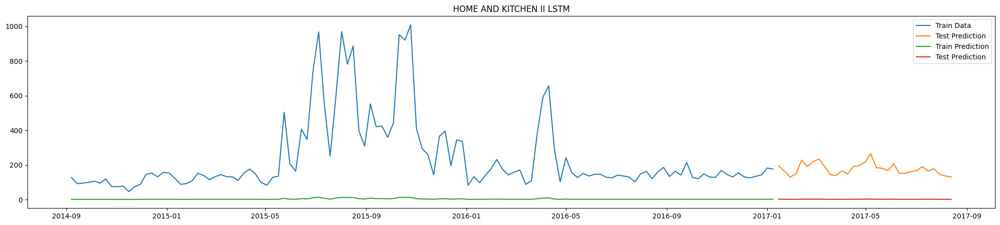

2/2 [==============================] - 0s 10ms/step


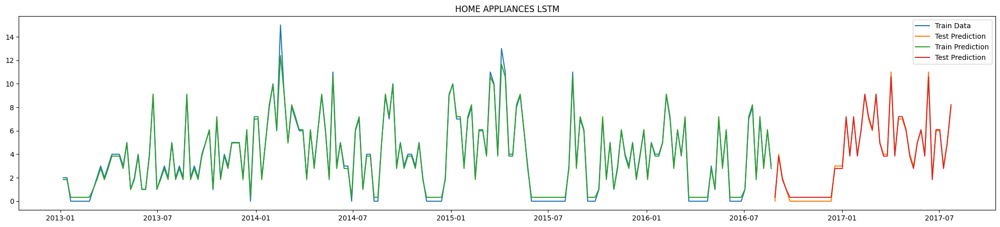

In [57]:
# prompt: invers data train, data test, prediksi data train, dan prediksi data test dengan index yang sama dengan data sebelum discaling

import matplotlib.pyplot as plt
for fam in filtered_fam:
  train_prediction = scaler.inverse_transform(lstm_models[fam].predict(train_data_scaled[fam]))
  test_prediction = scaler.inverse_transform(lstm_models[fam].predict(test_data_scaled[fam]))
  plt.figure(figsize=(25, 5))
  plt.title(f'{fam} LSTM')
  plt.plot(train_data[fam].index, train_data[fam], label='Train Data')
  plt.plot(test_data[fam].index, test_data[fam], label='Test Prediction')
  plt.plot(train_data[fam].index, train_prediction, label='Train Prediction')
  plt.plot(test_data[fam].index, test_prediction, label='Test Prediction')
  plt.legend()
  plt.show()

In [78]:
lstm_test_rmse = {}
for fam in filtered_fam:
  # RMSE data train
  lstm_train_rmse = mean_squared_error(train_data[fam]['sales'], scaler.inverse_transform(lstm_models[fam].predict(train_data_scaled[fam])))**0.5
  # RMSE data test
  lstm_test_rmse[fam] = mean_squared_error(test_data[fam]['sales'], scaler.inverse_transform(lstm_models[fam].predict(test_data_scaled[fam])))**0.5
  # Print RMSE
  print(f'RMSE {fam} Train LSTM: {lstm_train_rmse}')
  print(f'RMSE {fam} Test LSTM: {lstm_test_rmse[fam]}')
  print()

2/2 [==============================] - 0s 11ms/step
RMSE GROCERY I Train LSTM: 22083.942959355143
RMSE GROCERY I Test LSTM: 21569.389636540567

2/2 [==============================] - 0s 7ms/step
RMSE GROCERY II Train LSTM: 135.411434485189
RMSE GROCERY II Test LSTM: 212.35790107740175

2/2 [==============================] - 0s 12ms/step
RMSE HARDWARE Train LSTM: 3.2121369541828293
RMSE HARDWARE Test LSTM: 3.23401598654336

1/1 [==============================] - 0s 41ms/step
RMSE HOME AND KITCHEN I Train LSTM: 182.308674626928
RMSE HOME AND KITCHEN I Test LSTM: 207.66804162802094

1/1 [==============================] - 0s 32ms/step
RMSE HOME AND KITCHEN II Train LSTM: 316.9022388942433
RMSE HOME AND KITCHEN II Test LSTM: 177.74114670613722

2/2 [==============================] - 0s 10ms/step
RMSE HOME APPLIANCES Train LSTM: 0.29904735209286204
RMSE HOME APPLIANCES Test LSTM: 0.23353560520229213



In [79]:
lstm_test_rmse

{'GROCERY I': 21569.389636540567,
 'GROCERY II': 212.35790107740175,
 'HARDWARE': 3.23401598654336,
 'HOME AND KITCHEN I': 207.66804162802094,
 'HOME AND KITCHEN II': 177.74114670613722,
 'HOME APPLIANCES': 0.23353560520229213}

In [61]:
from sklearn.ensemble import RandomForestRegressor

In [62]:
train_size = 0.8
train_data = {}
test_data = {}

for fam in filtered_fam:
  # Tentukan jumlah data untuk train
  train_len = int(len(df_filtered_w[fam]) * train_size)

  # Bagi data menjadi train dan test
  train_data[fam] = df_filtered_w[fam].iloc[:train_len]
  test_data[fam] = df_filtered_w[fam].iloc[train_len:]

In [68]:
test_data['GROCERY I']

,sales
date,
2016-09-11,19364.0
2016-09-18,19178.0
2016-09-25,17740.0
2016-10-02,19541.0
2016-10-09,19252.0
2016-10-16,20592.0
2016-10-23,18923.0
2016-10-30,19224.0
2016-11-06,23744.0


In [63]:
rf_model = RandomForestRegressor(n_estimators=100, criterion='squared_error', max_depth=20, max_features='auto')
rf_models = {}

for fam in filtered_fam:
  rf_models[fam] = rf_model.fit(train_data[fam], train_data[fam]['sales'])
  print(f'Model Random Forest {fam} telah dibuat dan dilatih')
  print()

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


Model Random Forest GROCERY I telah dibuat dan dilatih

Model Random Forest GROCERY II telah dibuat dan dilatih



/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


Model Random Forest HARDWARE telah dibuat dan dilatih

Model Random Forest HOME AND KITCHEN I telah dibuat dan dilatih



/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


Model Random Forest HOME AND KITCHEN II telah dibuat dan dilatih

Model Random Forest HOME APPLIANCES telah dibuat dan dilatih



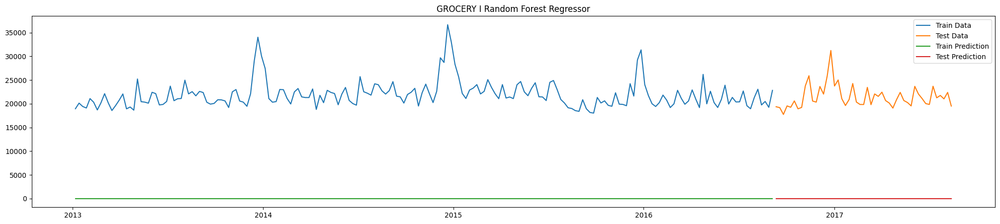

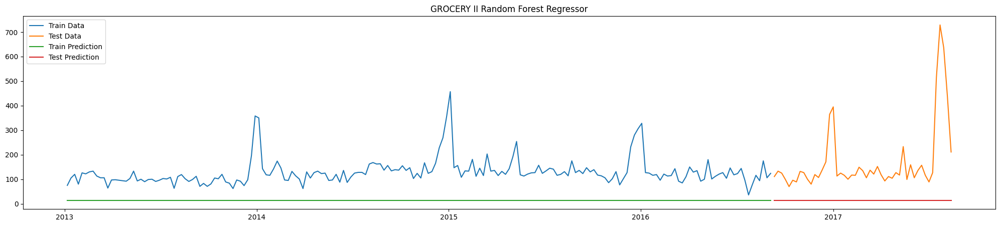

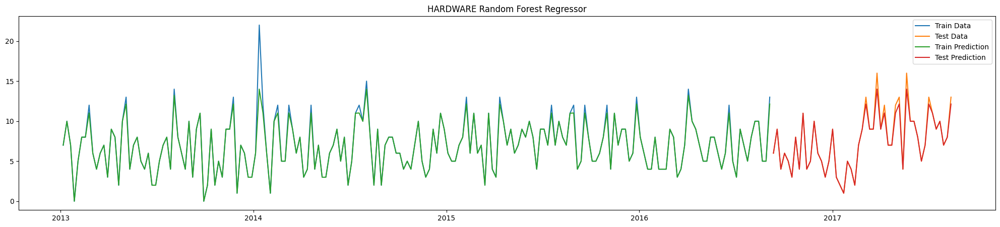

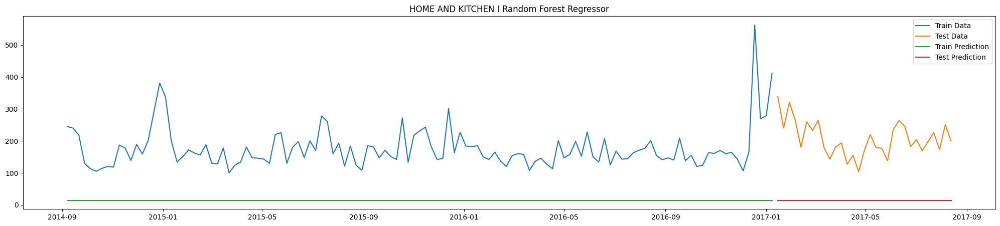

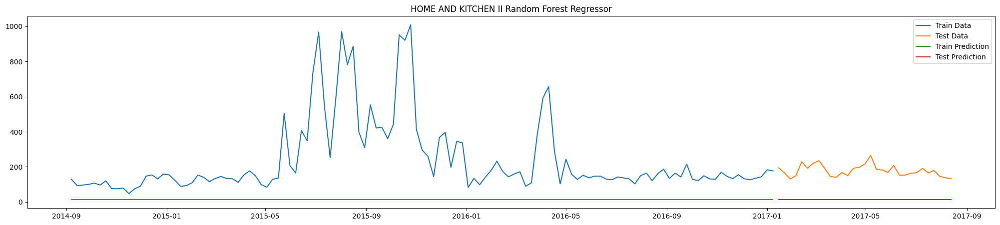

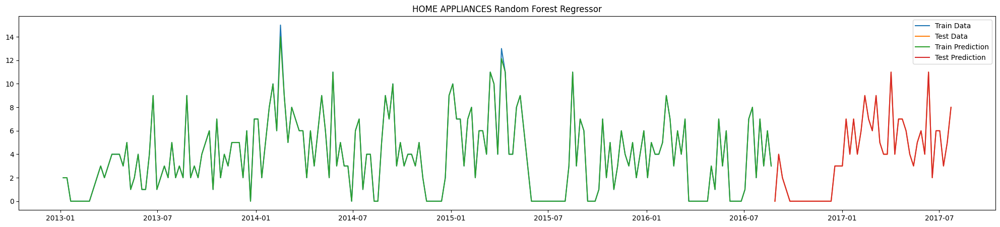

In [65]:
for fam in filtered_fam:
  # Plot hasil prediksi train dan test dari model random forest regressor
  plt.figure(figsize=(25, 5))
  plt.title(f'{fam} Random Forest Regressor')
  plt.plot(train_data[fam].index, train_data[fam]['sales'], label='Train Data')
  plt.plot(test_data[fam].index, test_data[fam]['sales'], label='Test Data')
  plt.plot(train_data[fam].index, rf_models[fam].predict(train_data[fam]), label='Train Prediction')
  plt.plot(test_data[fam].index, rf_models[fam].predict(test_data[fam]), label='Test Prediction')
  plt.legend()
  plt.show()

In [80]:
rf_test_rmse = {}
for fam in filtered_fam:
  # RMSE data train
  rf_train_rmse = mean_squared_error(train_data[fam]['sales'], rf_models[fam].predict(train_data[fam]))**0.5
  # RMSE data test
  rf_test_rmse[fam] = mean_squared_error(test_data[fam]['sales'], rf_models[fam].predict(test_data[fam]))**0.5
  # Print RMSE
  print(f'RMSE {fam} Train RF: {rf_train_rmse}')
  print(f'RMSE {fam} Test RF: {rf_test_rmse[fam]}')
  print()

RMSE GROCERY I Train RF: 22074.33166074944
RMSE GROCERY I Test RF: 21559.173495194995

RMSE GROCERY II Train RF: 127.43768902225642
RMSE GROCERY II Test RF: 209.17188518302456

RMSE HARDWARE Train RF: 0.6504177343574411
RMSE HARDWARE Test RF: 0.5127158579763338

RMSE HOME AND KITCHEN I Train RF: 173.8986014240361
RMSE HOME AND KITCHEN I Test RF: 200.13447092295945

RMSE HOME AND KITCHEN II Train RF: 311.51966882532577
RMSE HOME AND KITCHEN II Test RF: 166.80363189362282

RMSE HOME APPLIANCES Train RF: 0.09574087836172007
RMSE HOME APPLIANCES Test RF: 0.0020412414523192715



In [82]:
# prompt: tampilkan seluruh nilai rmse dan tampilkan rmse terkecil dari model yang telah dibuat tiap-tiap kategori family

for fam in filtered_fam:
  print(f'RMSE {fam}:')
  print(f'ARIMA: {arima_test_rmse[fam]:.2f}')
  print(f'SARIMA: {sarima_test_rmse[fam]:.2f}')
  print(f'LSTM: {lstm_test_rmse[fam]:.2f}')
  print(f'Random Forest: {rf_test_rmse[fam]:.2f}')
  print()

# Mencari model dengan RMSE terkecil untuk setiap kategori family
best_models = {}
for fam in filtered_fam:
  models = {'ARIMA': arima_test_rmse[fam], 'SARIMA': sarima_test_rmse[fam], 'LSTM': lstm_test_rmse[fam], 'Random Forest': rf_test_rmse[fam]}
  best_model = min(models, key=models.get)
  best_models[fam] = best_model

print('Model dengan RMSE terkecil untuk setiap kategori family:')
for fam, model in best_models.items():
  print(f'{fam}: {model}')


RMSE GROCERY I:
ARIMA: 2434.48
SARIMA: 1624.87
LSTM: 21569.39
Random Forest: 21559.17

RMSE GROCERY II:
ARIMA: 144.63
SARIMA: 154.65
LSTM: 212.36
Random Forest: 209.17

RMSE HARDWARE:
ARIMA: 3.67
SARIMA: 3.67
LSTM: 3.23
Random Forest: 0.51

RMSE HOME AND KITCHEN I:
ARIMA: 52.73
SARIMA: 56.47
LSTM: 207.67
Random Forest: 200.13

RMSE HOME AND KITCHEN II:
ARIMA: 32.31
SARIMA: 147.80
LSTM: 177.74
Random Forest: 166.80

RMSE HOME APPLIANCES:
ARIMA: 3.12
SARIMA: 3.14
LSTM: 0.23
Random Forest: 0.00

Model dengan RMSE terkecil untuk setiap kategori family:
GROCERY I: SARIMA
GROCERY II: ARIMA
HARDWARE: Random Forest
HOME AND KITCHEN I: ARIMA
HOME AND KITCHEN II: ARIMA
HOME APPLIANCES: Random Forest
